# Import the required Libraries

In [ ]:
# so we are to be importing libraries related to data analysis and libraries needed for CNN
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# now the CNN related libraries
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv1D, Conv2D, MaxPooling1D, MaxPooling2D
from tensorflow.keras.layers import Dense, Flatten, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# now the normal sklearn model that i would need to build my model and train it properly
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.metrics import mean_squared_error, root_mean_squared_error, r2_score, mean_absolute_error

# Load the dataset

In [ ]:
# load the dataset using pandas
df = pd.read_excel('/content/New project dataset.xlsx', skiprows = 30)
df

,YEAR,MONTH,DAY,DATE,Unnamed: 4,CO2_Conc,DST DAILY AVERAGE,Average of foF2,Average of hmF2,Average of TEC,"BX(GSE, GSM)",BY (GSE),BZ (GSE),BY (GSM),BZ (GSM),Solar Activity - F10.7,AP-Index,KP-Index
0,1974,5,19,1974-05-19,1974.3781,333.46,-10.875000,NaN,NaN,NaN,4.1,-2.2,0.9,-2.4,0.5,73.0,18.0,3.29125
1,1974,5,20,1974-05-20,1974.3808,333.64,-14.583333,NaN,NaN,NaN,3.6,-2.0,-0.4,-2.0,-0.8,72.5,18.0,3.25000
2,1974,5,21,1974-05-21,1974.3836,333.50,-6.375000,NaN,NaN,NaN,2.0,-1.9,-0.4,-1.7,-0.8,71.9,18.0,3.33125
3,1974,5,22,1974-05-22,1974.3863,333.21,-13.250000,NaN,NaN,NaN,3.4,-2.4,0.0,-2.3,-0.5,72.2,22.0,3.54125
4,1974,5,23,1974-05-23,1974.3890,333.05,-10.416667,NaN,NaN,NaN,2.6,-2.2,-1.1,-1.8,-1.6,71.5,25.0,3.70875
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15627,2025,5,4,2025-05-04,2025.3370,430.89,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
15628,2025,5,6,2025-05-06,2025.3425,430.77,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
15629,2025,5,7,2025-05-07,2025.3452,430.52,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
15630,2025,5,8,2025-05-08,2025.3479,430.81,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


# Check the information about the columns in the dataset

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15632 entries, 0 to 15631
Data columns (total 18 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   YEAR                    15632 non-null  int64         
 1   MONTH                   15632 non-null  int64         
 2   DAY                     15632 non-null  int64         
 3   DATE                    15632 non-null  datetime64[ns]
 4   Unnamed: 4              15632 non-null  float64       
 5   CO2_Conc                15632 non-null  float64       
 6   DST DAILY AVERAGE       15521 non-null  float64       
 7   Average of foF2         10575 non-null  float64       
 8   Average of hmF2         10575 non-null  float64       
 9   Average of TEC          10575 non-null  float64       
 10  BX(GSE, GSM)            15521 non-null  float64       
 11  BY (GSE)                15521 non-null  float64       
 12  BZ (GSE)                15521 non-null  float6

SO we can see that there is considerable gap in the ionospheric parameter values and the other parameters. Missing values are plenty

# Create the solar cycle phase column

In [ ]:
# so we want to perform a little feature engineering and create a column for our cycle phase
# we will do that by dividing the index of a row in the solar cycle by the total numbers in the solar cycle.
# first we convert the date column to datetime
df['DATE'] = pd.to_datetime(df['DATE'])
df['DATE'].info()

<class 'pandas.core.series.Series'>
RangeIndex: 15632 entries, 0 to 15631
Series name: DATE
Non-Null Count  Dtype         
--------------  -----         
15632 non-null  datetime64[ns]
dtypes: datetime64[ns](1)
memory usage: 122.3 KB


In [ ]:
# Create a dictionary containing the dates of the solar cycle periods
solar_cycles = {
    21: pd.Timestamp("1976-03-01"),
    22: pd.Timestamp("1986-09-01"),
    23: pd.Timestamp("1996-08-01"),
    24: pd.Timestamp("2008-12-01"),
    25: pd.Timestamp("2019-12-01")
}
solar_cycles

{21: Timestamp('1976-03-01 00:00:00'),
 22: Timestamp('1986-09-01 00:00:00'),
 23: Timestamp('1996-08-01 00:00:00'),
 24: Timestamp('2008-12-01 00:00:00'),
 25: Timestamp('2019-12-01 00:00:00')}

In [ ]:
# create a function that will help assign solar cycle as a new column in my dataset
# And phase to show how long into the solar cycle has been covered based on current data
def get_solar_cycle_phase(date):
    for cycle, start in sorted(solar_cycles.items()):
        if cycle < 25:
            end = solar_cycles[cycle + 1]
        else:
            end = pd.Timestamp("2023-01-01")
            # estimated end of solar cycle 25
        if start <= date < end:
            total_days = (end - start).days
            phase = (date - start).days / total_days
            return cycle, phase
    return None, None

In [ ]:
# Now apply this function to the df_model
## Add solar cycle id and phase as columns to my dataset
df['solar_cycle'], df['cycle_phase'] = zip(*df['DATE'].apply(get_solar_cycle_phase))
df

,YEAR,MONTH,DAY,DATE,Unnamed: 4,CO2_Conc,DST DAILY AVERAGE,Average of foF2,Average of hmF2,Average of TEC,"BX(GSE, GSM)",BY (GSE),BZ (GSE),BY (GSM),BZ (GSM),Solar Activity - F10.7,AP-Index,KP-Index,solar_cycle,cycle_phase
0,1974,5,19,1974-05-19,1974.3781,333.46,-10.875000,NaN,NaN,NaN,4.1,-2.2,0.9,-2.4,0.5,73.0,18.0,3.29125,NaN,NaN
1,1974,5,20,1974-05-20,1974.3808,333.64,-14.583333,NaN,NaN,NaN,3.6,-2.0,-0.4,-2.0,-0.8,72.5,18.0,3.25000,NaN,NaN
2,1974,5,21,1974-05-21,1974.3836,333.50,-6.375000,NaN,NaN,NaN,2.0,-1.9,-0.4,-1.7,-0.8,71.9,18.0,3.33125,NaN,NaN
3,1974,5,22,1974-05-22,1974.3863,333.21,-13.250000,NaN,NaN,NaN,3.4,-2.4,0.0,-2.3,-0.5,72.2,22.0,3.54125,NaN,NaN
4,1974,5,23,1974-05-23,1974.3890,333.05,-10.416667,NaN,NaN,NaN,2.6,-2.2,-1.1,-1.8,-1.6,71.5,25.0,3.70875,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15627,2025,5,4,2025-05-04,2025.3370,430.89,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
15628,2025,5,6,2025-05-06,2025.3425,430.77,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
15629,2025,5,7,2025-05-07,2025.3452,430.52,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
15630,2025,5,8,2025-05-08,2025.3479,430.81,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


# Extract the important columns related to our work

In [ ]:
# so we want to check using CNN how co2 affects dst's effect on the ionosphere
# so we be selecting dst, co2, cycle phase, tec, foF2, and hmF2
df_model = df[['cycle_phase', 'DST DAILY AVERAGE', 'CO2_Conc', 'Average of TEC', 'Average of foF2', 'Average of hmF2']]
df_model

,cycle_phase,DST DAILY AVERAGE,CO2_Conc,Average of TEC,Average of foF2,Average of hmF2
0,NaN,-10.875000,333.46,NaN,NaN,NaN
1,NaN,-14.583333,333.64,NaN,NaN,NaN
2,NaN,-6.375000,333.50,NaN,NaN,NaN
3,NaN,-13.250000,333.21,NaN,NaN,NaN
4,NaN,-10.416667,333.05,NaN,NaN,NaN
...,...,...,...,...,...,...
15627,NaN,NaN,430.89,NaN,NaN,NaN
15628,NaN,NaN,430.77,NaN,NaN,NaN
15629,NaN,NaN,430.52,NaN,NaN,NaN
15630,NaN,NaN,430.81,NaN,NaN,NaN


# Remove missing values from our data sample for modelling

In [ ]:
df_model.dropna(inplace = True)
df_model

/tmp/ipython-input-1568853675.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_model.dropna(inplace = True)


,cycle_phase,DST DAILY AVERAGE,CO2_Conc,Average of TEC,Average of foF2,Average of hmF2
3691,0.177802,-17.583333,354.44,17.266667,7.181250,315.466667
3692,0.178078,-5.166667,354.40,20.321739,7.884826,326.391304
3693,0.178355,-7.208333,354.53,19.659091,7.788636,329.518182
3694,0.178631,1.041667,354.69,23.045833,8.347917,328.000000
3695,0.178907,-3.500000,354.62,15.304167,6.602667,322.758333
...,...,...,...,...,...,...
14930,0.989352,-1.416667,420.83,3.100000,3.890909,294.351515
14931,0.990240,-3.833333,419.26,10.560563,7.131396,248.450000
14932,0.991127,-7.541667,419.47,7.903977,6.158258,255.663068
14933,0.992014,-19.625000,419.42,8.336538,6.067841,276.241667


# There is a need to standardise our data in order not to introduce any bias when training with CNN

In [ ]:
# define our standard scalar for the independent variables (x train)
ss_x = StandardScaler()
ss_x

StandardScaler()

In [ ]:
# define our standard scaler for the dependent variables (y train)
ss_y = StandardScaler()
ss_y

StandardScaler()

## Split the data into train and test

### Assign the independent variables to x and the dependent varaibles to y

In [ ]:
x = df_model.iloc[:, [0,1,2]].values
x.shape

(10072, 3)

In [ ]:
# First we just want the value of TEC and we will train the model to check interaction
y = df_model[['Average of TEC']].values
y.shape

(10072, 1)

### Now we divide our data into x train and y train

In [ ]:
# first we split the data into train and test
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.3, train_size = 0.7, random_state = 42)
x_train.shape, y_train.shape, x_test.shape, y_test.shape

((7050, 3), (7050, 1), (3022, 3), (3022, 1))

## Now we standardise the x values

In [ ]:
x_train[:] = ss_x.fit_transform(x_train)
x_train

array([[ 0.92401107, -0.20752635,  0.01601941],
       [ 1.19016653,  1.02566832,  1.40100387],
       [-0.69180068, -2.31574518, -0.92291858],
       ...,
       [ 1.6137835 , -0.2596651 , -0.03388077],
       [ 0.44024049, -1.93717256, -1.41682848],
       [-0.10889512,  0.41360479,  0.85108357]])

In [ ]:
# now we transform the x test
x_test[:] = ss_x.transform(x_test)
x_test

array([[ 0.73706478,  0.12797514, -1.43414079],
       [-0.48671906,  0.88285349, -1.70859175],
       [-0.66960111,  0.05316737, -0.89287664],
       ...,
       [ 0.35484205,  0.22998573,  1.54052068],
       [ 1.36720968, -0.26873271, -0.14895668],
       [-1.12770173, -2.25680573, -1.80482781]])

## Now onto the y values

In [ ]:
y_train = ss_y.fit_transform(y_train)
y_train

array([[-0.22113215],
       [-0.43719121],
       [ 1.01908342],
       ...,
       [-0.58528378],
       [-1.27120714],
       [ 1.15592667]])

In [ ]:
np.unique(y_train)

array([-1.27120714, -1.06242533, -1.05783672, ...,  4.90965213,
        4.93374234,  5.59794381])

In [ ]:
# now i transform the test
y_test[:] = ss_y.transform(y_test)
y_test

array([[-1.27120714],
       [ 1.63510447],
       [ 1.59782201],
       ...,
       [-0.62965766],
       [-0.78752581],
       [ 1.1045463 ]])

# Now we reshape the data points of x_train and x_test to be fit to train CNN

In [ ]:
x_train = x_train.reshape(x_train.shape[0], 1, x_train.shape[1])
x_train

array([[[ 0.92401107, -0.20752635,  0.01601941]],

       [[ 1.19016653,  1.02566832,  1.40100387]],

       [[-0.69180068, -2.31574518, -0.92291858]],

       ...,

       [[ 1.6137835 , -0.2596651 , -0.03388077]],

       [[ 0.44024049, -1.93717256, -1.41682848]],

       [[-0.10889512,  0.41360479,  0.85108357]]])

In [ ]:
x_test = x_test.reshape(x_test.shape[0], 1, x_test.shape[1])
x_test

array([[[ 0.73706478,  0.12797514, -1.43414079]],

       [[-0.48671906,  0.88285349, -1.70859175]],

       [[-0.66960111,  0.05316737, -0.89287664]],

       ...,

       [[ 0.35484205,  0.22998573,  1.54052068]],

       [[ 1.36720968, -0.26873271, -0.14895668]],

       [[-1.12770173, -2.25680573, -1.80482781]]])

# Now build the model

In [ ]:
# we want to check the shape of the x train we reshaped
x_train.shape

(7050, 1, 3)

In [ ]:
# using the sequential model type to stack layers in order
# This a 5 layer CNN model built
model = Sequential(
    [
        # Now unto the convolutional layer
        Conv1D(
            # we want to learn 16 different patterns from our input variables, we could increase this consequently
            filters = 16,
            # all my input variables are same daily averages so same time step so we just need to observe the patterns at a single instant
            kernel_size = 1,
            # I think this is the preferred activation for regression better than sigmoid.
            activation = 'relu',
            # we want the model to know that the input sample has a shape of 1 timestep and 3 features
            input_shape = (1, x_train.shape[2])
        ),
        # This is the reshaping layer, reshapes the output from the convolutionary layer to a 1D vector
        Flatten(),
        # Dense layer only accepts flat input, this layer learns the non-linear combinations of the the extracted patterns, 32 is enough capacity for the model to learn all these without overfitting
        Dense(32, activation = 'relu'),
        # This prevents overfitting by randomly dropping 20% of neurons during training
        Dropout(0.2),
        # this is the output layer, it produces the final predicted value. And we used Linear activation and not relu because this is a regression task and not an activation task
        Dense(1, activation = 'linear')
    ]
)

# to make sure that after the model is built what it predicts is quite accurate
# So we compile telling the model how to learn and what to measure during training
# so our loss function is the mean squared error, and for the metrics we use mean absolute error to tell us the average prediction error
model.compile(optimizer = 'adam', loss = 'mse', metrics = ['mae'])
# now we check the summary of the model, is architechture before its training
model.summary()

/usr/local/lib/python3.12/dist-packages/keras/src/layers/convolutional/base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv1d (Conv1D)                 │ (None, 1, 16)          │            64 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 32)             │           544 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 641 (2.50 KB)

 Trainable params: 641 (2.50 KB)

 Non-trainable params: 0 (0.00 B)

# Now we train the already built model

In [ ]:
# we name the variable that stores everything the model learned history
history = model.fit(
    x_train,
    y_train,
    # now how many times do we want our model to be trained on this data, so we are sure of our predictions
    epochs = 100,
    # we will train the model in batches of 16 in a sigle epoch
    batch_size = 16,
    # now after training we validate using the test data this is what we will use to confirm what bwe have predicted
    validation_data = (x_test, y_test)
)

Epoch 1/100
441/441 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - loss: 0.7910 - mae: 0.6653 - val_loss: 0.5495 - val_mae: 0.5413
Epoch 2/100
441/441 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 0.5301 - mae: 0.5452 - val_loss: 0.4151 - val_mae: 0.4706
Epoch 3/100
441/441 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.4235 - mae: 0.4906 - val_loss: 0.3516 - val_mae: 0.4388
Epoch 4/100
441/441 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.3884 - mae: 0.4686 - val_loss: 0.3195 - val_mae: 0.4195
Epoch 5/100
441/441 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3524 - mae: 0.4407 - val_loss: 0.2992 - val_mae: 0.4040
Epoch 6/100
441/441 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3321 - mae: 0.4274 - val_loss: 0.2933 - val_mae: 0.3962
Epoch 7/100
441/441 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3348 - mae: 0.4233 - val_loss: 0.2733 - val_mae: 0.3822
Epoch 8/100
441/441 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.3383 - mae: 0.4256 - val_loss: 0.2642 - val_mae: 0.3742
Epoch 9/100
441/441 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/

# Visualises the Changes in the loss functions over each Epoch

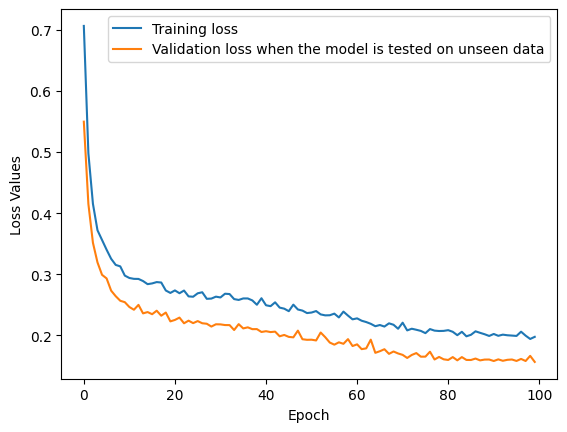

In [ ]:
plt.plot(history.history['loss'], label = 'Training loss')
plt.plot(history.history['val_loss'], label = 'Validation loss when the model is tested on unseen data')
plt.xlabel('Epoch')
plt.ylabel('Loss Values')
plt.legend()
plt.savefig('The visual generalisation check for the model using loss values.png', dpi = 300, bbox_inches = 'tight')
plt.show()

# Viualise how the Mea Absolute Error reduced. (That is the average error in model prediction kept reducing)

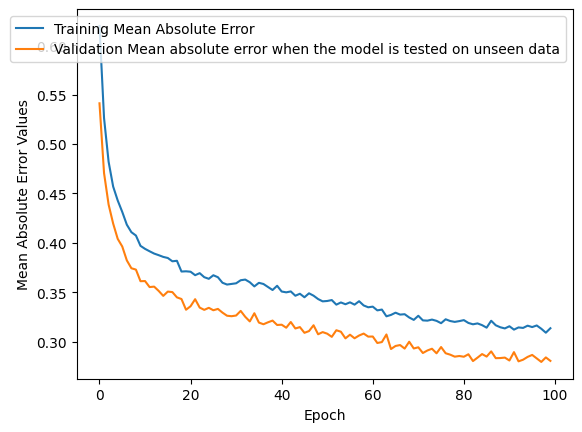

In [ ]:
plt.plot(history.history['mae'], label = 'Training Mean Absolute Error')
plt.plot(history.history['val_mae'], label = 'Validation Mean absolute error when the model is tested on unseen data')
plt.xlabel('Epoch')
plt.ylabel('Mean Absolute Error Values')
plt.legend()
plt.savefig('The visual generalisation check for the model using mae values.png', dpi = 300, bbox_inches = 'tight')
plt.show()

### Let's check if the model explains a lot of variance in the model

In [ ]:
y_pred = model.predict(x_test)

# now check the r2 score
from sklearn.metrics import r2_score
r2 = r2_score(y_test, y_pred)
r2

95/95 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


0.8511705348157754

# Now let us study our model using SHAP - Shapely Additive Explanations

## Get shap ready

In [ ]:
# This is a method that is used to explain how each input variable contributed to the model's prediction
# tHIS tells us feature importance, interpretability and physical meaning
# so we install SHAP
!pip install shap

In [ ]:
# now we import shap
import shap

## Create a small sample of the x test values to be used and apply the shap explainer, then calculate the shap values

In [ ]:
# create a small sample of the values so we can exert the shap method on
x_shap = x_test[:500]

# create the shap explainer
explainer = shap.DeepExplainer(model, x_shap)

# calculate the shap values
shap_values = explainer.shap_values(x_shap)
shap_values

/usr/local/lib/python3.12/dist-packages/shap/explainers/_deep/deep_tf.py:94: UserWarning: Your TensorFlow version is newer than 2.4.0 and so graph support has been removed in eager mode and some static graphs may not be supported. See PR #1483 for discussion.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/keras/src/models/functional.py:241: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: keras_tensor
Received: inputs=['Tensor(shape=(500, 1, 3))']
  warnings.warn(msg)
/usr/local/lib/python3.12/dist-packages/keras/src/models/functional.py:241: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: keras_tensor
Received: inputs=['Tensor(shape=(1000, 1, 3))']
  warnings.warn(msg)


array([[[[-5.43868723e-01],
         [-6.44630512e-04],
         [-5.78907549e-01]]],


       [[[ 1.94030228e+00],
         [-2.50099781e-03],
         [ 2.26290199e-01]]],


       [[[ 1.32043123e+00],
         [-3.00977419e-03],
         [ 2.99872140e-02]]],


       ...,


       [[[-2.61603653e-01],
         [ 4.55831099e-03],
         [-1.42103333e-01]]],


       [[[ 2.56653860e-01],
         [ 2.32157073e-02],
         [ 1.36076171e-01]]],


       [[[-4.25011100e-01],
         [ 1.35102039e-03],
         [-1.68598964e-01]]]])

## Plot it to investigate the feature importance visually

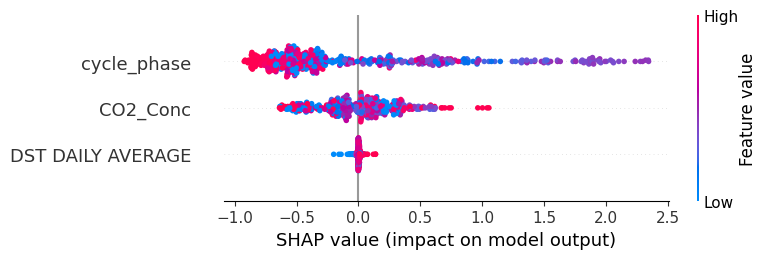

In [ ]:
# so we pass the feature names to a list
feature_names = ['cycle_phase', 'DST DAILY AVERAGE', 'CO2_Conc']

# we reshape the x_shap and the shape values. It is done because the values of x_test that it came from where 3 dimensional and shap only needs 2 dimensional objects
x_shap = x_shap.reshape(x_shap.shape[0], x_shap.shape[2])
shap_values = shap_values.reshape(shap_values.shape[0], shap_values.shape[2])

# we plot the shap values properly
shap.summary_plot(shap_values, x_shap, feature_names = feature_names, show = False)

So from the plot here we can clearly see that Dst has the least impact among the features as its width is the least. And the relationhip between each variable and the target is non-linear as the high and low impact points overlap each other

## We can numerically check the feature importance of each variable

In [ ]:
mean_abs_shap = np.mean(
    np.abs(
        shap_values), axis = 0
)
feature_importance = pd.DataFrame(
    {
        'Feature' : feature_names,
        'SHAP Mean' : mean_abs_shap
    }
).sort_values(by = 'SHAP Mean', ascending = False)

# print feature importance
feature_importance

,Feature,SHAP Mean
0,cycle_phase,0.655497
2,CO2_Conc,0.235221
1,DST DAILY AVERAGE,0.010474


In [ ]:
shap_values.shape

(500, 3)

In [ ]:
x_shap.shape

(500, 3)

## Now we investigate interaction between the variablles

### Does CO2 affect Dst's impact on TEC prediction

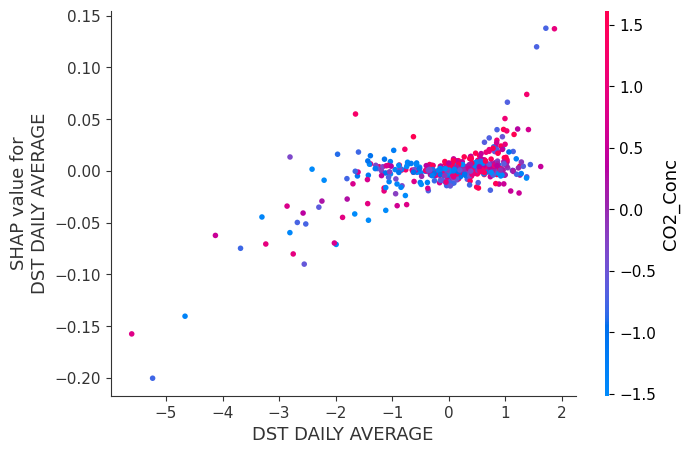

In [ ]:
# we are investigation the indirect, non-linear relationship between Dst and co2
shap.dependence_plot('DST DAILY AVERAGE', shap_values, x_shap, feature_names = feature_names, interaction_index = 'CO2_Conc', show = False)
plt.savefig("The plot to show how Dst's contribution to ionospheric variance changes as Dst changes and how that relationship depends on CO2.png", dpi=300, bbox_inches='tight')
plt.show()

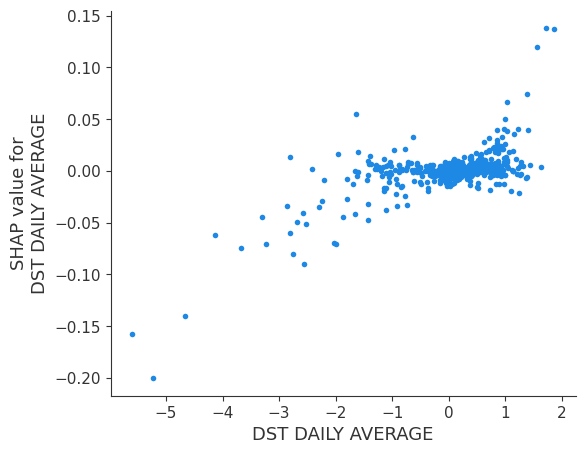

In [ ]:
# we are investigating which feature interacts the most with Dst
shap.dependence_plot('DST DAILY AVERAGE', shap_values, x_shap, feature_names = feature_names, interaction_index = None, show = False)
plt.savefig("The plot to show how Dst's contribution to ionospheric variance changes as Dst changes and which feature it interactsthe most with.png", dpi=300, bbox_inches='tight')
plt.show()

### Does Dst affect CO2's effect on the TEC prediction

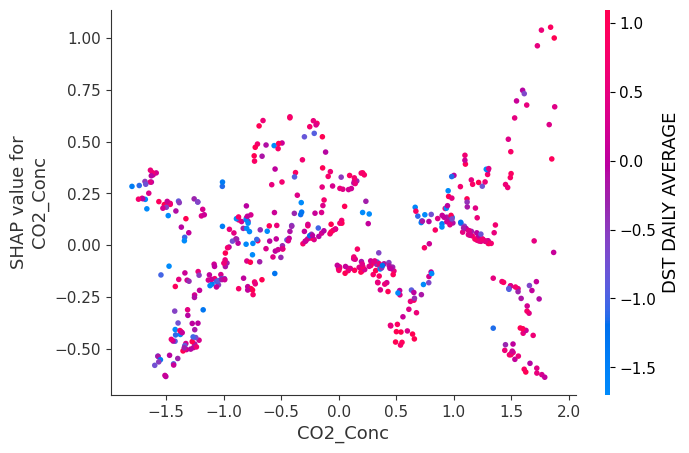

In [ ]:
# we are investigation the indirect, non-linear relationship between co2 and dst
shap.dependence_plot('CO2_Conc', shap_values, x_shap, feature_names = feature_names, interaction_index = 'DST DAILY AVERAGE', show = False)
plt.savefig("The plot to show how co2's contribution to ionospheric variance changes as co2 changes and how that relationship depends on dst.png", dpi=300, bbox_inches='tight')
plt.show()

### Checking which variable CO2 interacts the most with

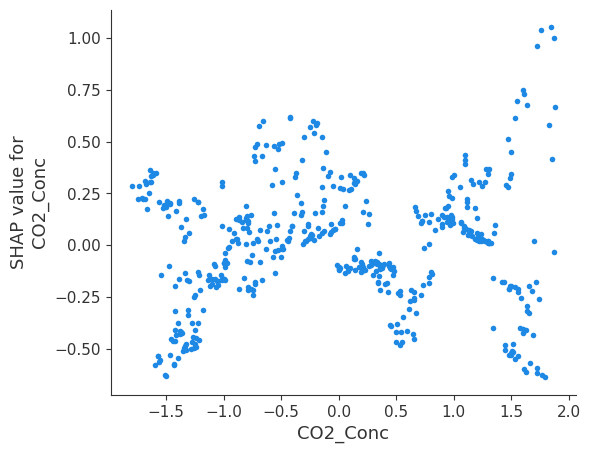

In [ ]:
# we are investigation the indirect, non-linear relationship between co2 and dst
shap.dependence_plot('CO2_Conc', shap_values, x_shap, feature_names = feature_names, interaction_index = None, show = False)
plt.savefig("The plot to show how co2's contribution to ionospheric variance changes as co2 changes and how it related with the variable it interacts the most with.png", dpi=300, bbox_inches='tight')
plt.show()

### This dependence plots of Dst and CO2 are showing non - linear interaction characteristics. So bwe use mutual info regression to check this non linear interaction.

In [ ]:
# first i prepare my data
co2 = x_shap[:, 2]
dst = x_shap[:, 1]

# prepare my shap values for the different co2 and dst values
co2_shap = shap_values[:, 2]
dst_shap = shap_values[:, 1]

##### How much does co2 impact dst prediction impact on the ionosphere

In [ ]:
# now the mutal info regression for Co2 on Dst shap values (i.e. how much knowing the value of co2 reduces the uncertainty of knowing dst's contribution to models output)
from sklearn.feature_selection import mutual_info_regression

# so if we get a zero, then co2 does not affect dst impact on the ionosphere
mutual_info = mutual_info_regression(co2.reshape(-1, 1), dst_shap)

# print the result
print(f"THe mutual relationship between co2 and Dst impact on TEC prediction is {mutual_info[0]}")

THe mutual relationship between co2 and Dst impact on TEC prediction is 0.2521417857709607


##### How much does dst impact co2 prediction impact on the ionosphere

In [ ]:
# so if we get a zero, then dst does not affect co2 impact on the ionosphere
mutual_info = mutual_info_regression(dst.reshape(-1, 1), co2_shap)

# print the result
print(f"THe mutual relationship between dst and co2 impact on TEC prediction is {mutual_info[0]}")

THe mutual relationship between dst and co2 impact on TEC prediction is 0.01772173044239711


## Investigating the level of Interaction between Co2 and solar cycle phase

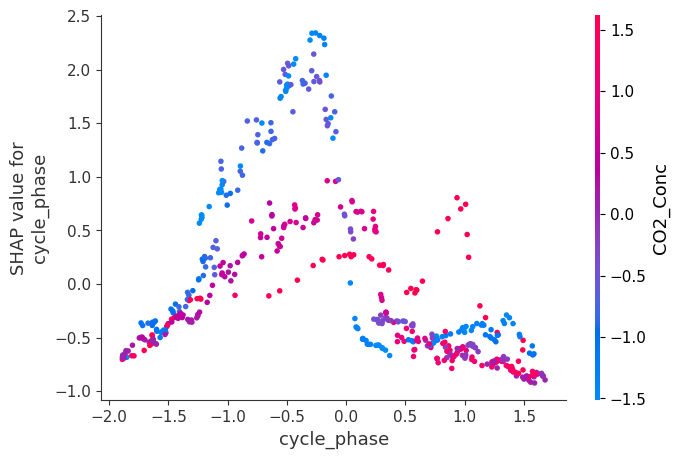

In [ ]:
# we are investigation the indirect, non-linear relationship between co2 and dst
shap.dependence_plot('cycle_phase', shap_values, x_shap, feature_names = feature_names, interaction_index = 'CO2_Conc', show = False)
plt.savefig("The plot to show how cycle phase's contribution to ionospheric variance changes as cycle phase changes and how that relationship depends on co2.png", dpi=300, bbox_inches='tight')
plt.show()

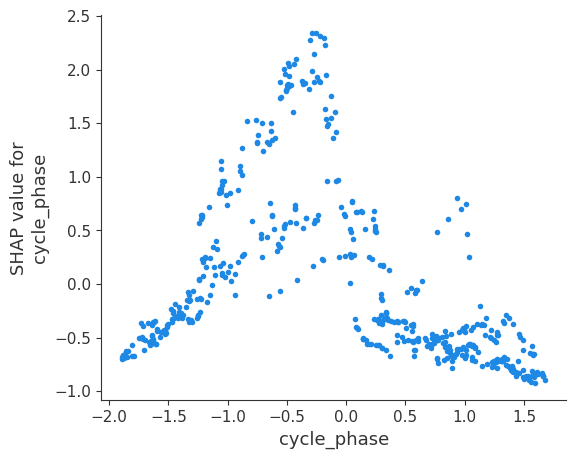

In [ ]:
# we are investigation the indirect, non-linear relationship between co2 and dst
shap.dependence_plot('cycle_phase', shap_values, x_shap, feature_names = feature_names, interaction_index = None, show = False)
plt.savefig("The plot to show how cycle phase's contribution to ionospheric variance changes as cycle phase changes and how it relates to the variable it interactes the most with.png", dpi=300, bbox_inches='tight')
plt.show()

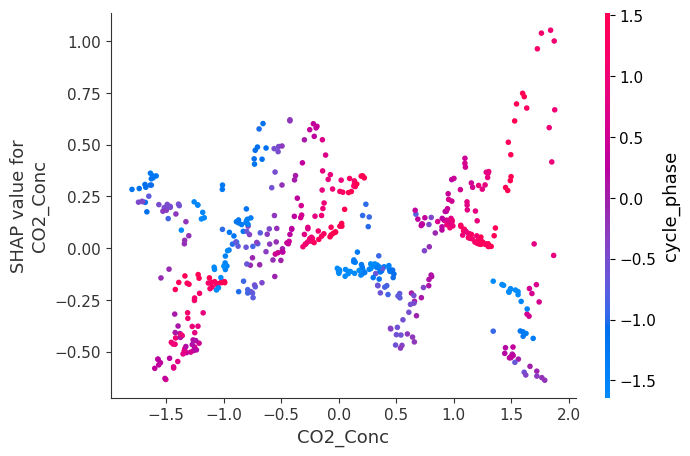

In [ ]:
# we are investigation the indirect, non-linear relationship between co2 and dst
shap.dependence_plot('CO2_Conc', shap_values, x_shap, feature_names = feature_names, interaction_index = 'cycle_phase', show = False)
plt.savefig("The plot to show how co2's contribution to ionospheric variance changes as co2 changes and how it relates to solar cycle phase.png", dpi=300, bbox_inches='tight')
plt.show()

### Now to check the mutual information regression score of co2 and shap cycle phase values to see if co2 affects cycle phase effect on TEC prediction

In [ ]:
# prepare the cycle phase data
cycle_phase = x_shap[:, 0]

# prepare the prediction values of cycle phase
cycle_phase_shap = shap_values[:, 0]

In [ ]:
# so if we get a zero, then co2 does not affect cycle phase impact on the ionosphere
mutual_info = mutual_info_regression(co2.reshape(-1, 1), cycle_phase_shap)

# print the result
print(f"THe mutual relationship between co2 and cycle phase impact on TEC prediction is {mutual_info[0]}")

THe mutual relationship between co2 and cycle phase impact on TEC prediction is 1.253348710451554


In [ ]:
# so if we get a zero, then cycle phase does not affect co2 impact on the ionosphere
mutual_info = mutual_info_regression(cycle_phase.reshape(-1, 1), co2_shap)

# print the result
print(f"THe mutual relationship between cycle phase and co2 impact on TEC prediction is {mutual_info[0]}")

THe mutual relationship between cycle phase and co2 impact on TEC prediction is 0.7314856754667329


# Okay we want to check for some specific values of TEC how all the variables contributed to the value being that value

## Check for the 50th TEC value

In [ ]:
# THe force plot relies on Javascript for initialisation so we will employ the initjs() library
shap.initjs()

# for better display since google colab wont support it directtly
from IPython.display import display
display(shap.force_plot(
    explainer.expected_value.numpy(),
    shap_values[50],
    feature_names = feature_names
))
plt.savefig('Example of force plot 50.png', dpi = 300, bbox_inches = 'tight')
plt.show()

<Figure size 640x480 with 0 Axes>

## Check for the 100th

In [ ]:
# THe force plot relies on Javascript for initialisation so we will employ the initjs() library
shap.initjs()

# for better display since google colab wont support it directtly
from IPython.display import display
display(shap.force_plot(
    explainer.expected_value.numpy(),
    shap_values[100],
    feature_names = feature_names
))
plt.savefig('Example of force plot 100.png', dpi = 300, bbox_inches = 'tight')
plt.show()

<Figure size 640x480 with 0 Axes>

## For the 120th

In [ ]:
# THe force plot relies on Javascript for initialisation so we will employ the initjs() library
shap.initjs()

# for better display since google colab wont support it directtly
from IPython.display import display
display(shap.force_plot(
    explainer.expected_value.numpy(),
    shap_values[120],
    feature_names = feature_names
))
plt.savefig('Example of force plot 120.png', dpi = 300, bbox_inches = 'tight')
plt.show()

<Figure size 640x480 with 0 Axes>

## For the 150th



In [ ]:
# THe force plot relies on Javascript for initialisation so we will employ the initjs() library
shap.initjs()

# for better display since google colab wont support it directtly
from IPython.display import display
display(shap.force_plot(
    explainer.expected_value.numpy(),
    shap_values[150],
    feature_names = feature_names
))
plt.savefig('Example of force plot 150.png', dpi = 300, bbox_inches = 'tight')
plt.show()

<Figure size 640x480 with 0 Axes>

# let's Examine all these on foF2

## FIrst assign the target and features to y and x respectively

In [ ]:
# Assign the new terget to y2
y2 = df_model['Average of foF2']
y2.shape

(10072,)

In [ ]:
# assign the features
x2 =  df_model[['cycle_phase', 'DST DAILY AVERAGE', 'CO2_Conc']]
x2.shape

(10072, 3)

## Split the data x and y into train, test, split

In [ ]:
x2_train, x2_test, y2_train, y2_test = train_test_split(x2, y2, test_size = 0.3, train_size = 0.7, random_state = 42)
x2_train.shape, y2_train.shape, x2_test.shape, y2_test.shape

((7050, 3), (7050,), (3022, 3), (3022,))

## Standardize the x and y train and test data

In [ ]:
ss_x2 = StandardScaler()
ss_x2

StandardScaler()

In [ ]:
# standardize x train and test values
x2_train[:] = ss_x2.fit_transform(x2_train)
x2_train

,cycle_phase,DST DAILY AVERAGE,CO2_Conc
9512,0.924011,-0.207526,0.016019
13397,1.190167,1.025668,1.401004
7723,-0.691801,-2.315745,-0.922919
6219,1.526953,-1.003209,-1.026283
13328,1.112810,0.053167,1.227881
...,...,...,...
10576,-1.626690,0.347865,0.032313
10032,1.415573,0.769508,0.009400
10232,1.613783,-0.259665,-0.033881
5220,0.440240,-1.937173,-1.416828


In [ ]:
# for x test values
x2_test[:] = ss_x2.transform(x2_test)
x2_test

,cycle_phase,DST DAILY AVERAGE,CO2_Conc
5489,0.737065,0.127975,-1.434141
4377,-0.486719,0.882853,-1.708592
7748,-0.669601,0.053167,-0.892877
5517,0.764676,-0.266466,-1.342487
3724,-1.219412,0.687900,-1.617957
...,...,...,...
5734,1.002333,-0.919334,-1.428540
5810,1.086154,0.184648,-1.293606
14556,0.354842,0.229986,1.540521
9980,1.367210,-0.268733,-0.148957


In [ ]:
ss_y2 = StandardScaler()
ss_y2

StandardScaler()

In [ ]:
# we have to reshape it because the standard scaler expects data with at least 1 columns.
y2_train = ss_y2.fit_transform(y2_train.values.reshape(-1, 1))
y2_train

array([[-0.26348659],
       [-0.49030449],
       [ 0.6939055 ],
       ...,
       [-0.84619068],
       [ 0.33257631],
       [ 1.28141168]])

In [ ]:
# now use it to transform the test value
y2_test = ss_y2.transform(y2_test.values.reshape(-1, 1))
y2_test

array([[-1.09354271],
       [ 1.39256669],
       [ 1.70727276],
       ...,
       [-0.73714903],
       [-1.035194  ],
       [ 1.4892411 ]])

## Now Build the model

### Let's reshape the x train and test data to fit the CNN model

In [ ]:
x2_train = x2_train.values.reshape(x2_train.shape[0], 1, x2_train.shape[1])
x2_train.shape

(7050, 1, 3)

In [ ]:
x2_test = x2_test.values.reshape(x2_test.shape[0], 1, x2_test.shape[1])
x2_test.shape

(3022, 1, 3)

In [ ]:
model2 = Sequential(
    [
        Conv1D(
            # we want about 16 filters to learn patterns in all directions
            filters = 16,
            # The kernel size is one because all 3 independent variables occur in one time step
            kernel_size = 1,
            # This is a very powerful activation to use
            activation = 'relu',
            # what is the input shape of the variables that are going to be entering the model, we want it to know that is 3 features in one time step
            input_shape = (1, x2_train.shape[2])
        ),
        # we want to change the shape of the output of the convolutional data and put it in a flattened format that the remaining model layers an access
        Flatten(),
        # the dense layer
        Dense(32, activation = 'relu'),
        # in order to avoid over fitting we can then drop out about 20% of the features to reduce over fitting
        Dropout(0.2),
        # Then the output layer now since this is a regression task we want out output linear, so we won't be using relu activation
        Dense(1, activation = 'linear')
    ]
)

# Now we compile everything and set a loss mechanism to check how far the model prediction is far from the expected out
# so we want to check the deviation of our model from the actual value using loss function and then
model2.compile(optimizer = 'adam', loss = 'mse', metrics = ['mae'])
# now we view the model summary
model2.summary()

/usr/local/lib/python3.12/dist-packages/keras/src/layers/convolutional/base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv1d_1 (Conv1D)               │ (None, 1, 16)          │            64 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 32)             │           544 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 641 (2.50 KB)

 Trainable params: 641 (2.50 KB)

 Non-trainable params: 0 (0.00 B)

### Now lets determine how many times our model is going to learn and how many samples it will learn at a time

In [ ]:
# we assign everything that goes on in the models training to a variable history
history2 = model2.fit(
    x2_train,
    y2_train,
    # how many do we want to keep on training before it stops learning
    epochs = 100,
    # and how many parameter do we want it to learn at a time
    batch_size = 16,
    # now we perform validation on the test data, so after each learning it checks if it performed well on the test data
    validation_data = (x2_test, y2_test)
)

Epoch 1/100
441/441 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - loss: 0.8213 - mae: 0.7288 - val_loss: 0.4330 - val_mae: 0.5035
Epoch 2/100
441/441 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - loss: 0.4568 - mae: 0.5241 - val_loss: 0.3712 - val_mae: 0.4735
Epoch 3/100
441/441 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - loss: 0.3923 - mae: 0.4847 - val_loss: 0.3349 - val_mae: 0.4479
Epoch 4/100
441/441 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - loss: 0.3677 - mae: 0.4695 - val_loss: 0.3124 - val_mae: 0.4363
Epoch 5/100
441/441 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - loss: 0.3465 - mae: 0.4560 - val_loss: 0.2910 - val_mae: 0.4163
Epoch 6/100
441/441 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - loss: 0.3198 - mae: 0.4370 - val_loss: 0.2840 - val_mae: 0.4118
Epoch 7/100
441/441 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - loss: 0.3194 - mae: 0.4372 - val_loss: 0.2786 - val_mae: 0.4068
Epoch 8/100
441/441 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.3028 - mae: 0.4236 - val_loss: 0.2711 - val_mae: 0.4032
Epoch 9/100
441/441 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms

## Now we check visually if our model generalised properly

### Let's check if our model loss reduce as we keep on training our model

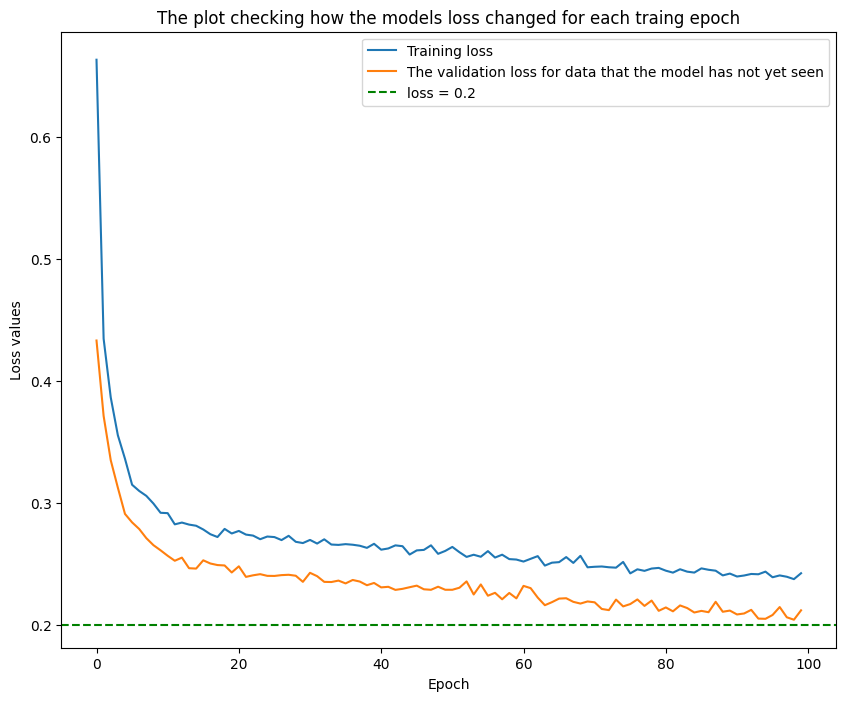

In [ ]:
plt.figure(figsize = (10,8))
plt.plot(history2.history['loss'], label = 'Training loss')
plt.plot(history2.history['val_loss'], label = 'The validation loss for data that the model has not yet seen')
# i want a straightr line drawn at the 0.2 loss value so that i can make proper inference
plt.axhline(y = 0.2, color = 'green', linestyle = '--', linewidth = 1.5, label = 'loss = 0.2')
plt.xlabel('Epoch')
plt.ylabel('Loss values')
plt.title('The plot checking how the models loss changed for each traing epoch')
plt.legend()
plt.savefig('The visual generalisation check for the model using loss values foF2.png', dpi = 300, bbox_inches = 'tight')
plt.show()

### Checking if our model mean absolute error kept reducing as we trained our model

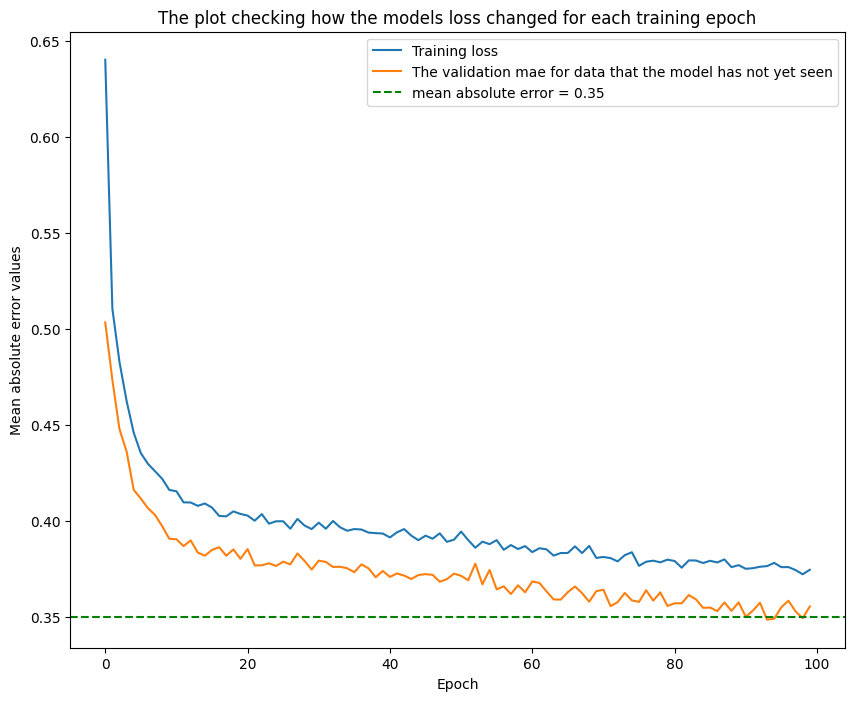

In [ ]:
plt.figure(figsize = (10,8))
plt.plot(history2.history['mae'], label = 'Training loss')
plt.plot(history2.history['val_mae'], label = 'The validation mae for data that the model has not yet seen')
# i want a straight line drawn at the 0.2 loss value so that i can make proper inference
plt.axhline(y = 0.35, color = 'green', linestyle = '--', linewidth = 1.5, label = 'mean absolute error = 0.35')
plt.xlabel('Epoch')
plt.ylabel('Mean absolute error values')
plt.title('The plot checking how the models loss changed for each training epoch')
plt.legend()
plt.savefig('The visual generalisation check for the model using mae values foF2.png', dpi = 300, bbox_inches = 'tight')
plt.show()

## Let's check if the model explains a lot of variance in the model

In [ ]:
# let's predict a set of y varaibles from the x test variables
y2_pred = model2.predict(x2_test)

# now we check the r2_score
from sklearn.metrics import r2_score
r2 = r2_score(y2_test, y2_pred)
r2

95/95 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


0.7979779869497324

## Let's check the feature importance of the variables in the model using shap

In [ ]:
# we have already imported shap
# now let's extract a small sample of x shap values for the model
x2_shap = x2_test[:500]

# now using the shap deep explainer we want to create each independent's variables impact on the prediction of the variable
explainer2 = shap.DeepExplainer(model2, x2_shap)

# so we get the shap values
shap_values2 = explainer2.shap_values(x2_shap)
shap_values2.shape

/usr/local/lib/python3.12/dist-packages/shap/explainers/_deep/deep_tf.py:94: UserWarning: Your TensorFlow version is newer than 2.4.0 and so graph support has been removed in eager mode and some static graphs may not be supported. See PR #1483 for discussion.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/keras/src/models/functional.py:241: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: keras_tensor_6
Received: inputs=['Tensor(shape=(500, 1, 3))']
  warnings.warn(msg)
/usr/local/lib/python3.12/dist-packages/keras/src/models/functional.py:241: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: keras_tensor_6
Received: inputs=['Tensor(shape=(1000, 1, 3))']
  warnings.warn(msg)


(500, 1, 3, 1)

## Now we plot the summary plot to check the importance of each feature of the independent variable in the model

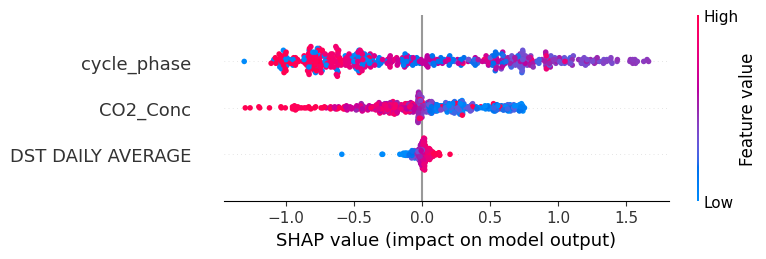

In [ ]:
# we have already assigned the feature names so we just go on to reshaping the x_shap and the shap_values
x2_shap = x2_shap.reshape(x2_shap.shape[0], x2_shap.shape[2])
shap_values2 = shap_values2.reshape(shap_values2.shape[0], shap_values2.shape[2])

# now we can check the summary plot
shap.summary_plot(shap_values2, x2_shap, feature_names = feature_names, show = False)
plt.savefig('The summary plot showing the importance of the features used in the model.png', dpi = 300, bbox_inches = 'tight')
plt.show()

Yeah once again we can see that dst has the least impact on the model's prediction

### We can also numerically calculate the feature importance using shap values generated

In [ ]:
# first we calculate the mean of tghe absolute shap values
mean_abs_shap2 = np.mean(
    np.abs(shap_values2), axis = 0
)

# now we put our results in the form of a data frame in descending order of importance
feature_importance2 = pd.DataFrame(
    {
        'feature_name' : feature_names,
        'Feature Average Importance' : mean_abs_shap2
    }
).sort_values(by = 'Feature Average Importance', ascending = False)

# print the feature importance
feature_importance2

,feature_name,Feature Average Importance
0,cycle_phase,0.659376
2,CO2_Conc,0.316936
1,DST DAILY AVERAGE,0.038268


## Next we can check how each feature affects the models prediction of some foF2 values

### For the 20th foF2 value

In [ ]:
# THe force plot relies on Javascript for initialisation so we will employ the initjs() library
shap.initjs()

# for better display since google colab wont support it directtly
from IPython.display import display
display(shap.force_plot(
    explainer2.expected_value.numpy(),
    shap_values2[20],
    feature_names = feature_names
))
plt.savefig('Example of force plot 20 foF2.png', dpi = 300, bbox_inches = 'tight')
plt.show()

<Figure size 640x480 with 0 Axes>

### For the 50th foF2 value

In [ ]:
# THe force plot relies on Javascript for initialisation so we will employ the initjs() library
shap.initjs()

# for better display since google colab wont support it directtly
from IPython.display import display
display(shap.force_plot(
    explainer2.expected_value.numpy(),
    shap_values2[50],
    feature_names = feature_names
))
plt.savefig('Example of force plot 50 foF2.png', dpi = 300, bbox_inches = 'tight')
plt.show()

<Figure size 640x480 with 0 Axes>

### For the 70th value of foF2 value

In [ ]:
# THe force plot relies on Javascript for initialisation so we will employ the initjs() library
shap.initjs()

# for better display since google colab wont support it directtly
from IPython.display import display
display(shap.force_plot(
    explainer2.expected_value.numpy(),
    shap_values2[70],
    feature_names = feature_names
))
plt.savefig('Example of force plot 70 foF2.png', dpi = 300, bbox_inches = 'tight')
plt.show()

<Figure size 640x480 with 0 Axes>

### For the 100th value

In [ ]:
# THe force plot relies on Javascript for initialisation so we will employ the initjs() library
shap.initjs()

# for better display since google colab wont support it directtly
from IPython.display import display
display(shap.force_plot(
    explainer2.expected_value.numpy(),
    shap_values2[100],
    feature_names = feature_names
))
plt.savefig('Example of force plot 100 foF2.png', dpi = 300, bbox_inches = 'tight')
plt.show()

<Figure size 640x480 with 0 Axes>

## Now we need to study the interaction relationship between variables in the model

### Studying the interaction relationship between Dst and co2 on foF2

#### Plot showing how dst prediction impact on foF2 changes as dst changes with co2 as the interation index

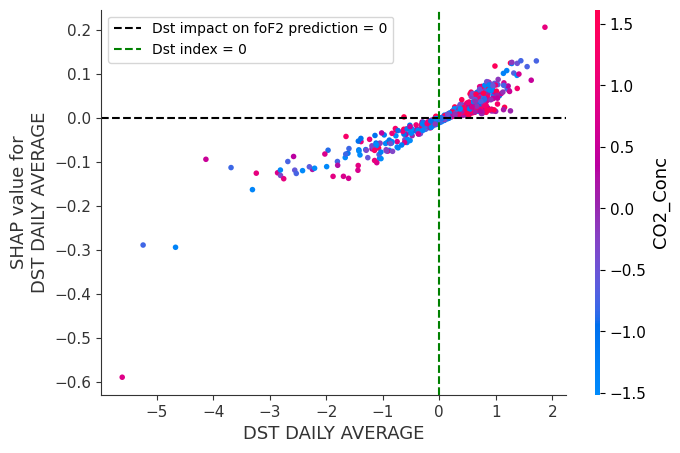

In [ ]:
# we check this using dependence plot
shap.dependence_plot('DST DAILY AVERAGE', shap_values2, x2_shap, feature_names = feature_names, interaction_index = 'CO2_Conc', show = False)
plt.savefig('The plot showing how Dst impact on foF2 prediction changes as Dst changes and its interaction with co2 on foF2.png', dpi = 300, bbox_inches = 'tight')
plt.axhline(y = 0.0, linestyle = '--', color = 'black', linewidth = 1.5, label = 'Dst impact on foF2 prediction = 0')
plt.axvline(x = 0, linestyle = '--', color = 'green', linewidth = 1.5, label = 'Dst index = 0')
plt.legend()
plt.show()

#### Check how co2's impact on prediction changes as co2 changes and how it relates to dst

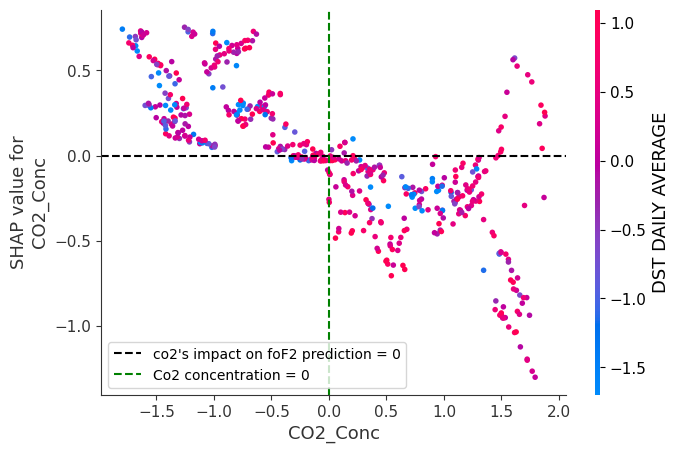

In [ ]:
# we check this using dependence plot
shap.dependence_plot('CO2_Conc', shap_values2, x2_shap, feature_names = feature_names, interaction_index = 'DST DAILY AVERAGE', show = False)
plt.savefig('The plot showing how co2 impact on foF2 prediction changes as co2 changes and its interaction with dst on foF2.png', dpi = 300, bbox_inches = 'tight')
plt.axhline(y = 0.0, linestyle = '--', color = 'black', linewidth = 1.5, label = "co2's impact on foF2 prediction = 0")
plt.axvline(x = 0, linestyle = '--', color = 'green', linewidth = 1.5, label = 'Co2 concentration = 0')
plt.legend()
plt.show()

### Now to numerically check dst and co2 interaction we use mutual information regression scores

In [ ]:
# first we extract dst and co2 values from x_shap
dst2 = x2_shap[:, 1]
co2_2 = x2_shap[:, 2]

# next extract dst and co2 prediction impact from the shap values generated by the model
dst_shap2 = shap_values2[:, 1]
co2_shap2 = shap_values2[:, 2]

#### Does co2 influence dst prediction impact on foF2

In [ ]:
# import mutual info regression
from sklearn.feature_selection import mutual_info_regression

# now use it to check whether co2 has an impact on dst's prediction impact on foF2
mutual_info2 = mutual_info_regression(co2_2.reshape(-1, 1), dst_shap2)

# print the result
print(f"The mutual information score between co2 and dst's prediction impact on foF2 is {mutual_info2[0]}")

The mutual information score between co2 and dst's prediction impact on foF2 is 0.09543844415914027


#### Does dst influence co2 prediction impact on foF2

In [ ]:
# now use it to check whether co2 has an impact on dst's prediction impact on foF2
mutual_info2 = mutual_info_regression(dst2.reshape(-1, 1), co2_shap2)

# print the result
print(f"The mutual information score between dst and co2's prediction impact on foF2 is {mutual_info2[0]}")

The mutual information score between dst and co2's prediction impact on foF2 is 0


### Next we study the interaction between CO2 and cycle phase

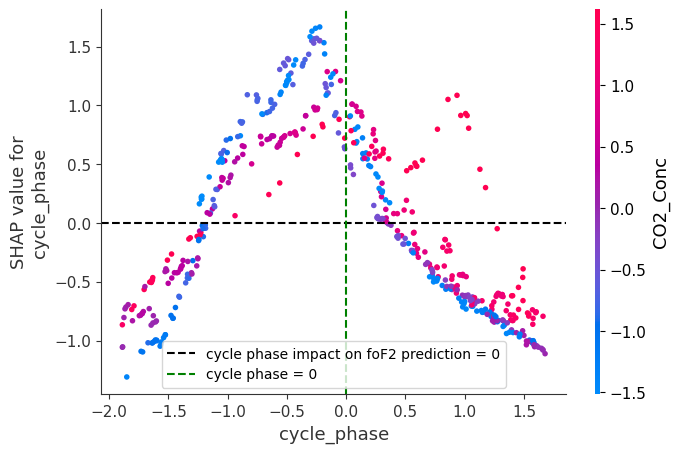

In [ ]:
# we check this using dependence plot
shap.dependence_plot('cycle_phase', shap_values2, x2_shap, feature_names = feature_names, interaction_index = 'CO2_Conc', show = False)
plt.savefig('The plot showing how cycle phase impact on foF2 prediction changes as cycle phase changes and its interaction with co2 on foF2.png', dpi = 300, bbox_inches = 'tight')
plt.axhline(y = 0.0, linestyle = '--', color = 'black', linewidth = 1.5, label = 'cycle phase impact on foF2 prediction = 0')
plt.axvline(x = 0, linestyle = '--', color = 'green', linewidth = 1.5, label = 'cycle phase = 0')
plt.legend()
plt.show()

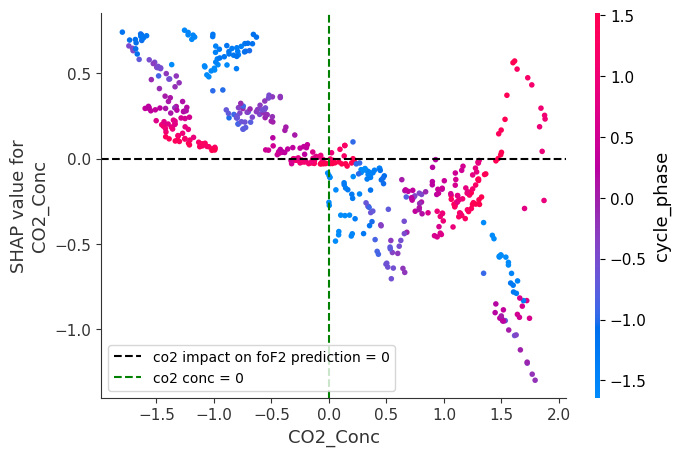

In [ ]:
# we check this using dependence plot
shap.dependence_plot('CO2_Conc', shap_values2, x2_shap, feature_names = feature_names, interaction_index = 'cycle_phase', show = False)
plt.savefig('The plot showing how co2 impact on foF2 prediction changes as co2 changes and its interaction with cycle phase on foF2.png', dpi = 300, bbox_inches = 'tight')
plt.axhline(y = 0.0, linestyle = '--', color = 'black', linewidth = 1.5, label = 'co2 impact on foF2 prediction = 0')
plt.axvline(x = 0, linestyle = '--', color = 'green', linewidth = 1.5, label = 'co2 conc = 0')
plt.legend()
plt.show()

### Now we can check the strength of the interaction between cycle phase and co2 using mutual info regression

In [ ]:
# first we prepare the cycle pahse data
cycle_phase2 = x2_shap[:, 0]

# next we extract cycle phase prediction impact on foF2 values
cycle_phase_shap2 = shap_values2[:, 0]

#### Does cycle phase affect the impact of co2 in foF2 prediction

In [ ]:
# now use it to check whether cycle phase has an impact on co2's prediction impact on foF2
mutual_info2 = mutual_info_regression(cycle_phase2.reshape(-1, 1), co2_shap2)

# print the result
print(f"The mutual information score between cycle phase and co2's prediction impact on foF2 is {mutual_info2[0]}")

The mutual information score between cycle phase and co2's prediction impact on foF2 is 1.0790142484619683


#### Does co2 affect the impact of cycle phase on foF2 prediction

In [ ]:
# now use it to check whether cycle phase has an impact on co2's prediction impact on foF2
mutual_info2 = mutual_info_regression(co2_2.reshape(-1, 1), cycle_phase_shap2)

# print the result
print(f"The mutual information score between cycle phase and co2's prediction impact on foF2 is {mutual_info2[0]}")

The mutual information score between cycle phase and co2's prediction impact on foF2 is 1.1263118739370164


### Next we study the interaction between cycle phase and Dst

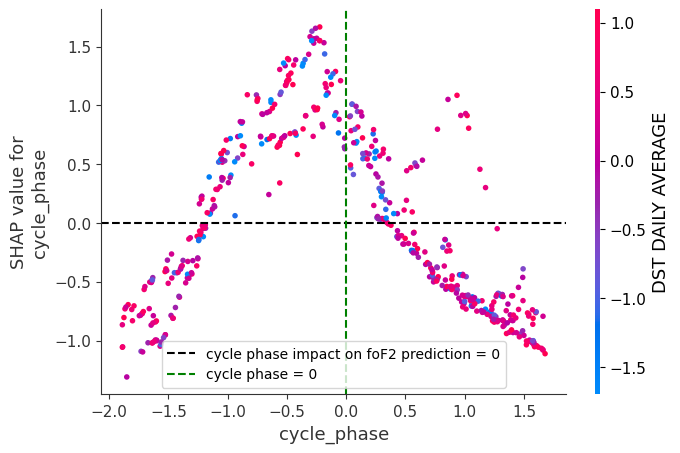

In [ ]:
# we check this using dependence plot
shap.dependence_plot('cycle_phase', shap_values2, x2_shap, feature_names = feature_names, interaction_index = 'DST DAILY AVERAGE', show = False)
plt.savefig('The plot showing how cycle phase impact on foF2 prediction changes as cycle phase changes and its interaction with dst on foF2.png', dpi = 300, bbox_inches = 'tight')
plt.axhline(y = 0.0, linestyle = '--', color = 'black', linewidth = 1.5, label = 'cycle phase impact on foF2 prediction = 0')
plt.axvline(x = 0, linestyle = '--', color = 'green', linewidth = 1.5, label = 'cycle phase = 0')
plt.legend()
plt.show()

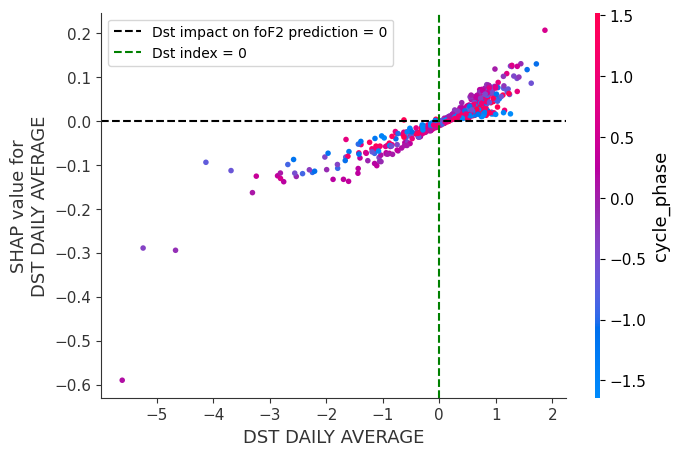

In [ ]:
# we check this using dependence plot
shap.dependence_plot('DST DAILY AVERAGE', shap_values2, x2_shap, feature_names = feature_names, interaction_index = 'cycle_phase', show = False)
plt.savefig('The plot showing how Dst impact on foF2 prediction changes as Dst changes and its interaction with cycle phase on foF2.png', dpi = 300, bbox_inches = 'tight')
plt.axhline(y = 0.0, linestyle = '--', color = 'black', linewidth = 1.5, label = 'Dst impact on foF2 prediction = 0')
plt.axvline(x = 0, linestyle = '--', color = 'green', linewidth = 1.5, label = 'Dst index = 0')
plt.legend()
plt.show()

#### Now we can check the strength of the interaction between dst and cycle phase numerically

In [ ]:
# now use it to check whether cycle phase has an impact on co2's prediction impact on foF2
mutual_info2 = mutual_info_regression(dst2.reshape(-1, 1), cycle_phase_shap2)

# print the result
print(f"The mutual information score between dst and cycle phase's prediction impact on foF2 is {mutual_info2[0]}")

The mutual information score between dst and cycle phase's prediction impact on foF2 is 0.04984732328290775


In [ ]:
# now use it to check whether cycle phase has an impact on co2's prediction impact on foF2
mutual_info2 = mutual_info_regression(cycle_phase2.reshape(-1, 1), dst_shap2)

# print the result
print(f"The mutual information score between cycle phase and co2's prediction impact on foF2 is {mutual_info2[0]}")

The mutual information score between cycle phase and co2's prediction impact on foF2 is 0.15254242304801657


# let's examine all these with hmF2

In [ ]:
# first let's assign the features to x and the target to y
x3 = df_model[['cycle_phase', 'DST DAILY AVERAGE', 'CO2_Conc']]
y3 = df_model['Average of hmF2']
x3.shape, y3.shape

((10072, 3), (10072,))

## Now we split the data using train test split

In [ ]:
# splitting the data
x3_train, x3_test, y3_train, y3_test = train_test_split(x3, y3, test_size = 0.3, train_size = 0.7, random_state = 42)
x3_train.shape, y3_train.shape, x3_test.shape, y3_test.shape

((7050, 3), (7050,), (3022, 3), (3022,))

## Now we standardise the x and y features

In [ ]:
ss_x3 = StandardScaler()
ss_x3

StandardScaler()

In [ ]:
ss_y3 = StandardScaler()
ss_y3

StandardScaler()

In [ ]:
x3_train[:] = ss_x3.fit_transform(x3_train)
x3_train.shape

(7050, 3)

In [ ]:
x3_test[:] = ss_x3.transform(x3_test)
x3_test

,cycle_phase,DST DAILY AVERAGE,CO2_Conc
5489,0.737065,0.127975,-1.434141
4377,-0.486719,0.882853,-1.708592
7748,-0.669601,0.053167,-0.892877
5517,0.764676,-0.266466,-1.342487
3724,-1.219412,0.687900,-1.617957
...,...,...,...
5734,1.002333,-0.919334,-1.428540
5810,1.086154,0.184648,-1.293606
14556,0.354842,0.229986,1.540521
9980,1.367210,-0.268733,-0.148957


In [ ]:
y3_train = ss_y3.fit_transform(y3_train.values.reshape(-1, 1))
y3_train

array([[-0.51468568],
       [-1.21534515],
       [ 1.20708989],
       ...,
       [-0.81206099],
       [-0.21442593],
       [ 0.69537629]])

In [ ]:
y3_test = ss_y3.transform(y3_test.values.reshape(-1, 1))
y3_test

array([[ 0.06828642],
       [ 1.72110234],
       [ 1.16515229],
       ...,
       [-0.64884996],
       [-1.19851662],
       [ 1.26279567]])

In [ ]:
# so first we have reshape our training data to suit the CNN model
x3_train = x3_train.values.reshape(x3_train.shape[0], 1, x3_train.shape[1])
x3_train.shape

(7050, 1, 3)

In [ ]:
x3_test = x3_test.values.reshape(x3_test.shape[0], 1, x3_test.shape[1])
x3_test.shape

(3022, 1, 3)

## Next we build the model well

In [ ]:
model3 = Sequential(
    [
        Conv1D(
            filters = 16,
            # so we want a kernel size of 1 as our data is only in one time step
            kernel_size = 1,
            # then we will choose the relu activation as it is better than the sigmoid activation for regression tasks
            activation = 'relu',
            # then lastly we want to give them the shape of the data coming in
            input_shape = (1, x3_train.shape[2])
        ),
        # now we add another layer and this layer is used for formatting the output of the convolutionary layer in a form that other layers can use
        Flatten(),
        # next is the dense layer which uses 32 neurons to learn patterns from the patterns learnt in tjhe convolutionary layer
        Dense(32, activation = 'relu'),
        # in order to prevent overfitting we will have to drop about 20 percent of the features
        Dropout(0.2),
        # lastly the output layer here we just end up studying to give result and in order to make sure that this is a regression task as it is meant to be are activation is linear here
        Dense(1, activation = 'linear')
    ]
)


# now we compile every thing and assign how we will calculate the models loss and the metric to evaluate its prediction here
model3.compile(optimizer = 'adam', loss = 'mse', metrics = ['mae'])
# now finally we print the model's summary
model3.summary()

/usr/local/lib/python3.12/dist-packages/keras/src/layers/convolutional/base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv1d_2 (Conv1D)               │ (None, 1, 16)          │            64 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_2 (Flatten)             │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 32)             │           544 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 641 (2.50 KB)

 Trainable params: 641 (2.50 KB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
# now we give the instructions on how the model is going to learn
# so we assign everything the model realises during training to history
history = model3.fit(
    x3_train,
    y3_train,
    epochs = 100,
    batch_size = 16,
    # to test the model on data it wasnt trained with we use validation test
    validation_data = (x3_test, y3_test)
)

Epoch 1/100
441/441 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - loss: 0.7217 - mae: 0.6636 - val_loss: 0.3586 - val_mae: 0.4589
Epoch 2/100
441/441 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - loss: 0.3777 - mae: 0.4752 - val_loss: 0.3015 - val_mae: 0.4200
Epoch 3/100
441/441 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3246 - mae: 0.4415 - val_loss: 0.2725 - val_mae: 0.4048
Epoch 4/100
441/441 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3176 - mae: 0.4346 - val_loss: 0.2630 - val_mae: 0.4001
Epoch 5/100
441/441 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3058 - mae: 0.4219 - val_loss: 0.2558 - val_mae: 0.3891
Epoch 6/100
441/441 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.3106 - mae: 0.4178 - val_loss: 0.2491 - val_mae: 0.3881
Epoch 7/100
441/441 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.2900 - mae: 0.4129 - val_loss: 0.2392 - val_mae: 0.3785
Epoch 8/100
441/441 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.2762 - mae: 0.4046 - val_loss: 0.2350 - val_mae: 0.3714
Epoch 9/100
441/441 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/

## Now we visually check whether the model generalises well

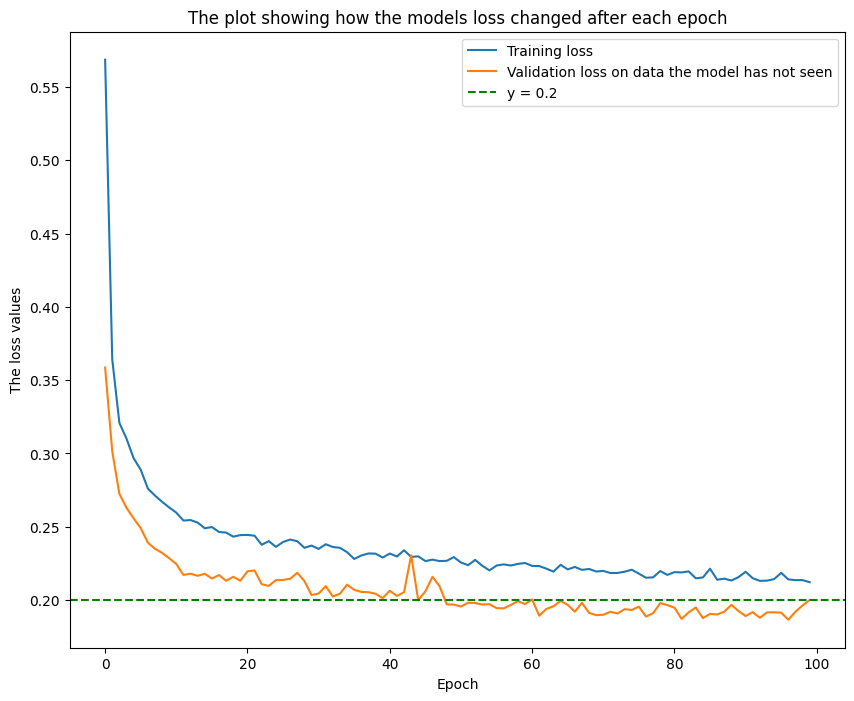

In [ ]:
# so we make a plot of all the loss error values and validation error value to make sure it reduces generally
plt.figure(figsize = (10,8))
plt.plot(history.history['loss'], label = 'Training loss')
plt.plot(history.history['val_loss'], label = 'Validation loss on data the model has not seen')
plt.axhline(y = 0.2, linestyle = '--', linewidth = 1.5, color = 'green', label = 'y = 0.2')
plt.xlabel('Epoch')
plt.ylabel('The loss values')
plt.title('The plot showing how the models loss changed after each epoch')
plt.legend()
plt.savefig('The plot showing the change in the models loss aftr each epoch for hmF2.png', dpi = 300, bbox_inches = 'tight')
plt.show()

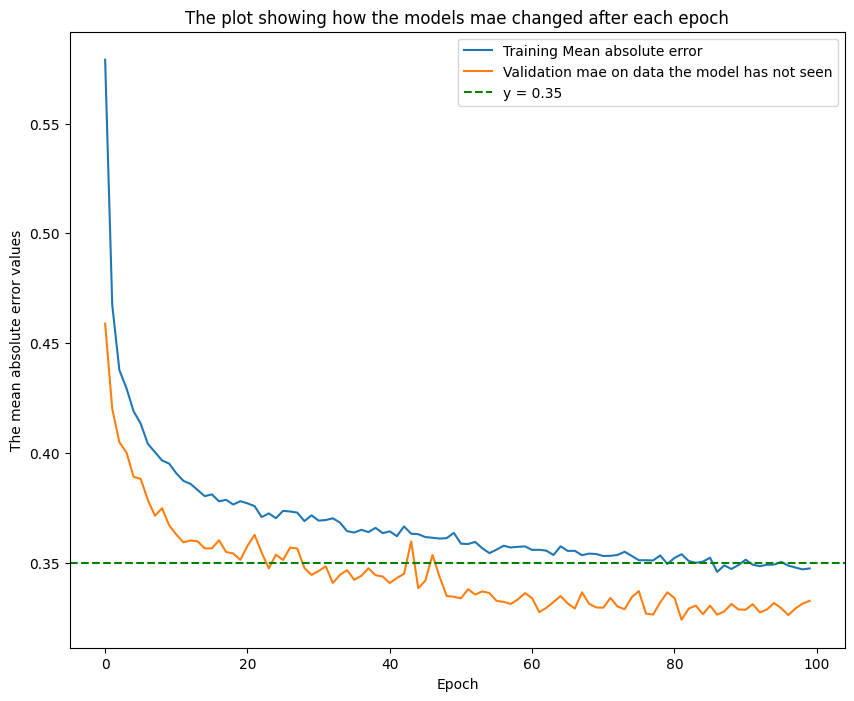

In [ ]:
# so we make a plot of all the loss error values and validation error value to make sure it reduces generally
plt.figure(figsize = (10,8))
plt.plot(history.history['mae'], label = 'Training Mean absolute error')
plt.plot(history.history['val_mae'], label = 'Validation mae on data the model has not seen')
plt.axhline(y = 0.35, linestyle = '--', linewidth = 1.5, color = 'green', label = 'y = 0.35')
plt.xlabel('Epoch')
plt.ylabel('The mean absolute error values')
plt.title('The plot showing how the models mae changed after each epoch')
plt.legend()
plt.savefig('The plot showing the change in the models mae aftr each epoch for hmF2.png', dpi = 300, bbox_inches = 'tight')
plt.show()

## Calculating how much variance the model explains for in the data

In [ ]:
# so we first of all predict with our model
y3_pred = model3.predict(x3_test)
y3_pred

95/95 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


array([[-0.3311257],
       [ 1.6063691],
       [ 1.0546565],
       ...,
       [-0.6839503],
       [-0.7434171],
       [ 1.2102189]], dtype=float32)

In [ ]:
# next we employ the r2_score parameter from sklearn
from sklearn.metrics import r2_score

r2 = r2_score(y3_test, y3_pred)
r2

0.8092819333152554

## Now we check the feature importance of the variables

In [ ]:
# we do that using the summary plot
# but first we must use a library shap to get the impact of each independent variable in predicting the independent variable
# so we get a sample of the data from out x_test
x3_shap = x3_test[:600]
x3_shap

array([[[ 0.73706478,  0.12797514, -1.43414079]],

       [[-0.48671906,  0.88285349, -1.70859175]],

       [[-0.66960111,  0.05316737, -0.89287664]],

       ...,

       [[ 0.6520663 , -0.54756165, -0.12553415]],

       [[-0.65217141,  0.53828439,  0.33578788]],

       [[-0.47291328,  0.18918149, -1.5599096 ]]])

In [ ]:
# next we go ahead and generate shap values for this variable using a shap explainer for CNN called Deep explainer
explainer3 = shap.DeepExplainer(model3, x3_shap)

# then after you generate the shap valyes
shap_values3 = explainer3.shap_values(x3_shap)
shap_values3

/usr/local/lib/python3.12/dist-packages/shap/explainers/_deep/deep_tf.py:94: UserWarning: Your TensorFlow version is newer than 2.4.0 and so graph support has been removed in eager mode and some static graphs may not be supported. See PR #1483 for discussion.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/keras/src/models/functional.py:241: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: keras_tensor_12
Received: inputs=['Tensor(shape=(600, 1, 3))']
  warnings.warn(msg)
/usr/local/lib/python3.12/dist-packages/keras/src/models/functional.py:241: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: keras_tensor_12
Received: inputs=['Tensor(shape=(1200, 1, 3))']
  warnings.warn(msg)


array([[[[-0.34580117],
         [-0.04320053],
         [ 0.16854388]]],


       [[[ 1.31084429],
         [-0.11424548],
         [ 0.52043839]]],


       [[[ 0.94084786],
         [-0.03863854],
         [ 0.26311515]]],


       ...,


       [[[-0.26177784],
         [ 0.06484267],
         [ 0.04632608]]],


       [[[ 0.47982433],
         [-0.1026295 ],
         [-0.1903448 ]]],


       [[[ 1.3470833 ],
         [-0.06382629],
         [ 0.47557285]]]])

In [ ]:
shap_values3 = shap_values3.reshape(600, 3)
x3_shap = x3_shap.reshape(600, 3)
shap_values3.shape, x3_shap.shape

((600, 3), (600, 3))

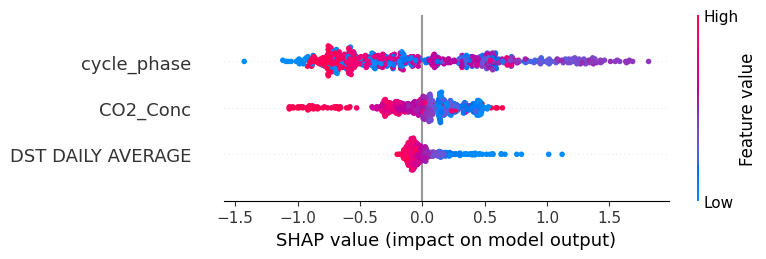

In [ ]:
# now we plot the summary plot of the whole thing
shap.summary_plot(shap_values3, x3_shap, feature_names = feature_names, show = False)
plt.savefig('The plot showing the importance of each feature in hmF2.png', dpi = 300, bbox_inches = 'tight')
plt.show()

## We can also numerically check the feature importance

In [ ]:
# we use the mean absolute value method
mean_abs_shap3 = np.mean(
    np.abs(shap_values3), axis = 0
)

# next we create a dictionary of the feature importance
feature_importance = pd.DataFrame(
    {
        'feature_importance' : feature_names,
    'Feature average importance' : mean_abs_shap3
    }
).sort_values(by = 'Feature average importance', ascending = False)

# PRINT RESULT
feature_importance

,feature_importance,Feature average importance
0,cycle_phase,0.590912
2,CO2_Conc,0.243652
1,DST DAILY AVERAGE,0.102916


## Now we want to see how some of the independent variables influence the prediction of hmF2

### so we would check for the 30th hmF2 value

In [ ]:
# we do this using force plots
# the plot is supported by javascript so we import the javascript stuff library for python
shap.initjs()

# now we import display to help the display of the plots
from IPython.display import display

display(
    shap.force_plot(
    explainer3.expected_value.numpy(),
    shap_values3[30],
    feature_names = feature_names
)
)

### Now let's check for 50th value

In [ ]:
# we do this using force plots
# the plot is supported by javascript so we import the javascript stuff library for python
shap.initjs()

# now we import display to help the display of the plots
from IPython.display import display

display(
    shap.force_plot(
    explainer3.expected_value.numpy(),
    shap_values3[50],
    feature_names = feature_names
)
)

### Checking for the 70tgh value

In [ ]:
# we do this using force plots
# the plot is supported by javascript so we import the javascript stuff library for python
shap.initjs()

# now we import display to help the display of the plots
from IPython.display import display

display(
    shap.force_plot(
    explainer3.expected_value.numpy(),
    shap_values3[70],
    feature_names = feature_names
)
)

### checking for the 500th value

In [ ]:
# we do this using force plots
# the plot is supported by javascript so we import the javascript stuff library for python
shap.initjs()

# now we import display to help the display of the plots
from IPython.display import display

display(
    shap.force_plot(
    explainer3.expected_value.numpy(),
    shap_values3[500],
    feature_names = feature_names
)
)

## Now let us study the interaction of the variables in the model

### First we prepare our data

In [ ]:
# get data from each of the variables
co2_3 = x3_shap[:, 2]
dst_3 = x3_shap[:, 1]
cycle_phase3 = x3_shap[:, 0]

# then we will prepare out shap values for every variable
co2_shap3 = shap_values3[:, 2]
dst_shap3 = shap_values3[:, 1]
cycle_phase_shap3 = shap_values3[:, 0]

### To investigate dst and co2 interaction on hmF2

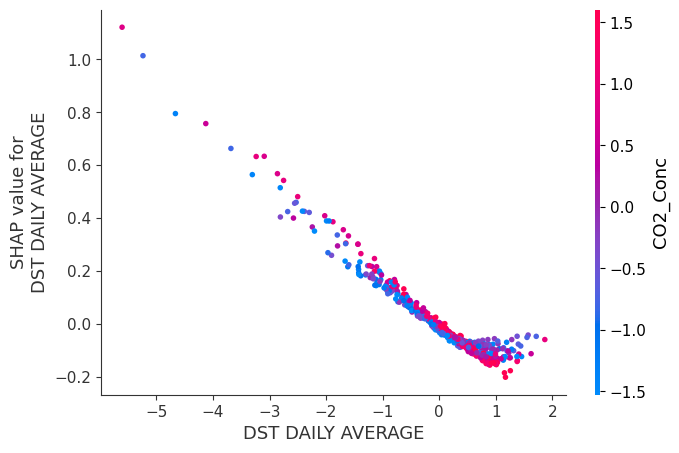

In [ ]:
# now we study interaction using dependence plots
shap.dependence_plot('DST DAILY AVERAGE', shap_values3, x3_shap, feature_names = feature_names, interaction_index = 'CO2_Conc', show = False)
plt.savefig('The scatter plot showing how the impact of dst on hmF2 prediction changes with dst as well as its interaction with co2 on hmF2.png', dpi = 300, bbox_inches = 'tight')
plt.show()

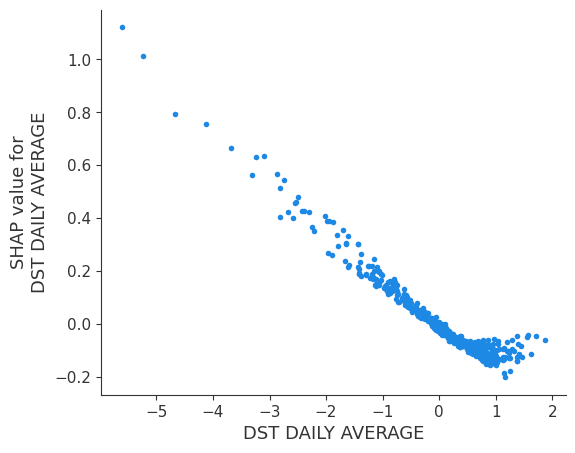

In [ ]:
# now we study interaction using dependence plots
shap.dependence_plot('DST DAILY AVERAGE', shap_values3, x3_shap, feature_names = feature_names, interaction_index = None, show = False)
plt.savefig('The scatter plot showing how the impact of dst on hmF2 prediction changes with dst as well as its interaction with co2 on hmF2.png', dpi = 300, bbox_inches = 'tight')
plt.show()

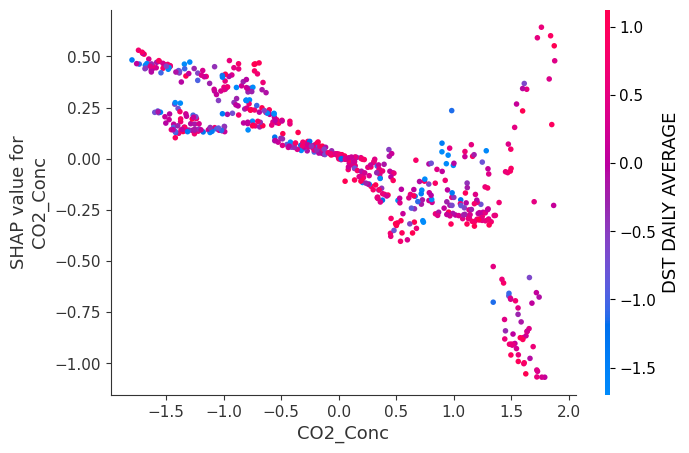

In [ ]:
# now we study interaction using dependence plots
shap.dependence_plot('CO2_Conc', shap_values3, x3_shap, feature_names = feature_names, interaction_index = 'DST DAILY AVERAGE', show = False)
plt.savefig('The scatter plot showing how the impact of co2 on hmF2 prediction changes with co2 as well as its interaction with dst on hmF2.png', dpi = 300, bbox_inches = 'tight')
plt.show()

### So apart from visuals lets evaluate the realtionship mathemaically

In [ ]:
mutual_info3 = mutual_info_regression(dst_3.reshape(-1, 1), co2_shap3)

# now we print the result
print(f"Now the mutual information of dst and co2's impact on the ionosphere {mutual_info3[0]}")

Now the mutual information of dst and co2's impact on the ionosphere 0.09167894350495898


In [ ]:
mutual_info3 = mutual_info_regression(co2_3.reshape(-1, 1), dst_shap3)

# now we print the result
print(f"Now the mutual information of co2 and dst's impact on the ionosphere {mutual_info3[0]}")

Now the mutual information of co2 and dst's impact on the ionosphere 0.10713367863861567


### Now we can visually check the interaction between o2 and cycle phase

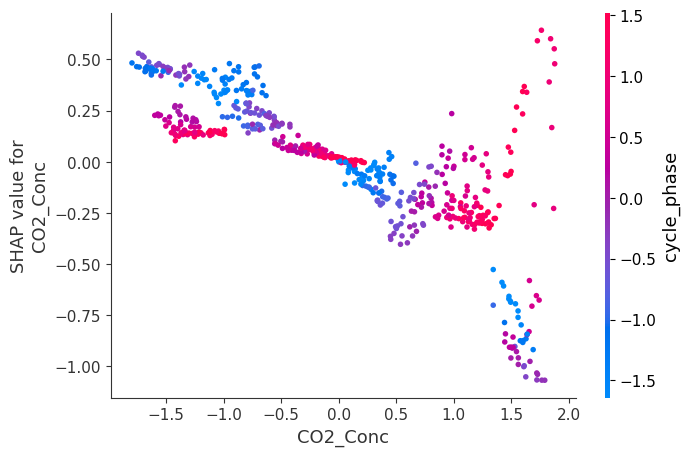

In [ ]:
# now we study interaction using dependence plots
shap.dependence_plot('CO2_Conc', shap_values3, x3_shap, feature_names = feature_names, interaction_index = 'cycle_phase', show = False)
plt.savefig('The scatter plot showing how the impact of co2 on hmF2 prediction changes with co2 as well as its interaction with cycle phase on hmF2.png', dpi = 300, bbox_inches = 'tight')
plt.show()

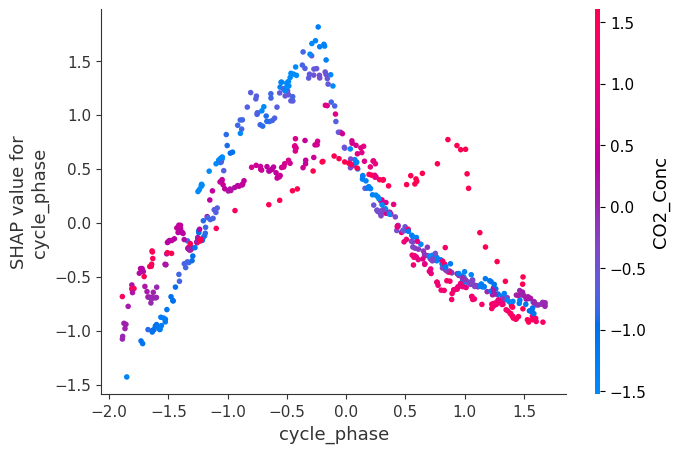

In [ ]:
# now we study interaction using dependence plots
shap.dependence_plot('cycle_phase', shap_values3, x3_shap, feature_names = feature_names, interaction_index = 'CO2_Conc', show = False)
plt.savefig('The scatter plot showing how the impact of cycle phase on hmF2 prediction changes with cycle phase as well as its interaction with co2 on hmF2.png', dpi = 300, bbox_inches = 'tight')
plt.show()

#### Let's investigate the interaction numerically

In [ ]:
mutual_info3 = mutual_info_regression(co2_3.reshape(-1, 1), cycle_phase_shap3)

# now we print the result
print(f"Now the mutual information of co2 on cycle phase impact on hmF2 prediction {mutual_info3[0]}")

Now the mutual information of co2 on cycle phase impact on hmF2 prediction 1.1113245363127335


In [ ]:
mutual_info3 = mutual_info_regression(cycle_phase3.reshape(-1, 1), co2_shap3)

# now we print the result
print(f"Now the mutual information of co2 on cycle phase impact on hmF2 prediction {mutual_info3[0]}")

Now the mutual information of co2 on cycle phase impact on hmF2 prediction 1.1404998050229942


### Now let's investigate the relationship between dst and cycle phase

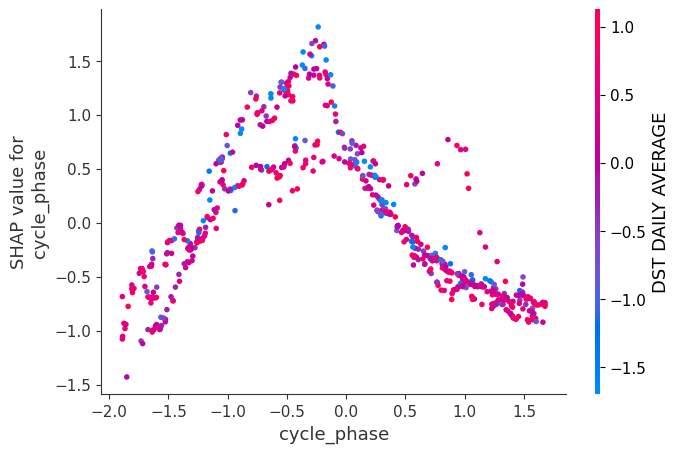

In [ ]:
# now we study interaction using dependence plots
shap.dependence_plot('cycle_phase', shap_values3, x3_shap, feature_names = feature_names, interaction_index = 'DST DAILY AVERAGE', show = False)
plt.savefig('The scatter plot showing how the impact of cycle phase on hmF2 prediction changes with cycle phase as well as its interaction with co2 on hmF2.png', dpi = 300, bbox_inches = 'tight')
plt.show()

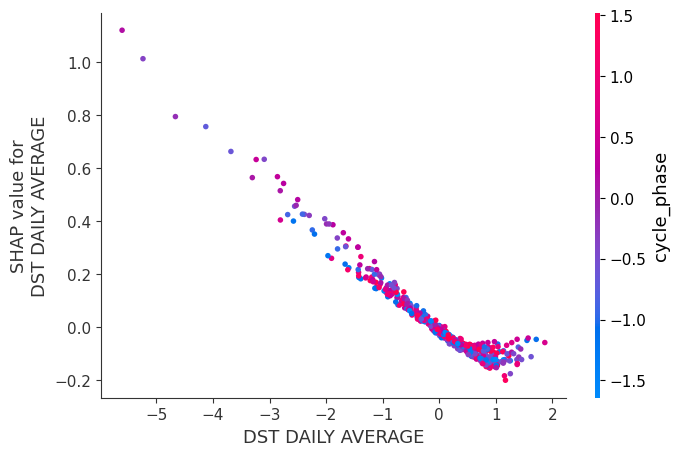

In [ ]:
# now we study interaction using dependence plots
shap.dependence_plot('DST DAILY AVERAGE', shap_values3, x3_shap, feature_names = feature_names, interaction_index = 'cycle_phase', show = False)
plt.savefig('The scatter plot showing how the impact of cycle phase on hmF2 prediction changes with cycle phase as well as its interaction with co2 on hmF2.png', dpi = 300, bbox_inches = 'tight')
plt.show()

#### let's inspect this values numerically

In [ ]:
mutual_info3 = mutual_info_regression(cycle_phase3.reshape(-1, 1), dst_shap3)

# now we print the result
print(f"Now the mutual information of cycle phase on dst impact on hmF2 prediction {mutual_info3[0]}")

Now the mutual information of cycle phase on dst impact on hmF2 prediction 0.10451238674606467


In [ ]:
mutual_info3 = mutual_info_regression(dst_3.reshape(-1, 1), cycle_phase_shap3)

# now we print the result
print(f"Now the mutual information of dst on cycle phase impact on hmF2 prediction {mutual_info3[0]}")

Now the mutual information of dst on cycle phase impact on hmF2 prediction 0.026334052993329582


# Now we do this on storm time data to check dst importance as a variable, its impact on prediction and its interaction with other variables

In [ ]:
# so let us modify our data a little bit
# we will filter our data for only storm time periods
df_storm = df_model[df_model['DST DAILY AVERAGE'] <= -50]
df_storm

,cycle_phase,DST DAILY AVERAGE,CO2_Conc,Average of TEC,Average of foF2,Average of hmF2
3777,0.204583,-61.041667,349.16,8.300000,5.500000,418.900000
3778,0.204859,-55.500000,349.52,12.834843,7.031533,308.180836
3801,0.212866,-79.500000,348.93,15.445833,7.567208,317.133333
3802,0.213142,-55.083333,349.22,17.258333,8.123958,315.050000
3808,0.214798,-50.250000,349.76,22.293750,9.325000,311.306250
...,...,...,...,...,...,...
13484,0.884989,-105.083333,406.73,3.496682,3.570472,289.721801
13485,0.885238,-59.958333,406.72,5.123506,4.320894,264.303187
14552,0.624667,-59.125000,414.24,7.962007,5.167601,305.854839
14897,0.952085,-50.208333,416.60,15.148601,7.582556,291.126923


## So now we want to assign the features to x and the target to y

In [ ]:
# so we filter out the x features now
x_storm = df_storm[['cycle_phase', 'DST DAILY AVERAGE', 'CO2_Conc']]
x_storm

,cycle_phase,DST DAILY AVERAGE,CO2_Conc
3777,0.204583,-61.041667,349.16
3778,0.204859,-55.500000,349.52
3801,0.212866,-79.500000,348.93
3802,0.213142,-55.083333,349.22
3808,0.214798,-50.250000,349.76
...,...,...,...
13484,0.884989,-105.083333,406.73
13485,0.885238,-59.958333,406.72
14552,0.624667,-59.125000,414.24
14897,0.952085,-50.208333,416.60


In [ ]:
# then next we assign the y features
y_storm = df_storm[['Average of TEC', 'Average of foF2', 'Average of hmF2']]
y_storm.shape

(381, 3)

## Now we split the data into train and test

In [ ]:
# split the data into train and test
x_storm_train, x_storm_test, y_storm_train, y_storm_test = train_test_split(x_storm, y_storm, test_size = 0.3, train_size = 0.7, random_state = 42)
x_storm_train.shape, x_storm_test.shape, y_storm_train.shape, y_storm_test.shape

((266, 3), (115, 3), (266, 3), (115, 3))

## Now we standardise everything to avoid distractions of values to the model

In [ ]:
ss_x_storm = StandardScaler()
ss_x_storm

StandardScaler()

In [ ]:
ss_y_storm = StandardScaler()
ss_y_storm

StandardScaler()

In [ ]:
x_storm_train[:] = ss_x_storm.fit_transform(x_storm_train)
x_storm_train

,cycle_phase,DST DAILY AVERAGE,CO2_Conc
9062,0.911071,0.694408,0.255076
8410,0.092243,0.144515,-0.074615
8097,-0.292060,-1.516792,-0.154933
6099,2.136073,0.323936,-0.859008
7135,-1.487549,0.127902,-0.409488
...,...,...,...
4669,-0.021679,0.242532,-0.841519
5265,0.877271,-1.679601,-0.785167
8767,0.520217,-2.726224,0.244065
12393,0.456558,0.453518,2.115338


In [ ]:
x_storm_test = ss_x_storm.transform(x_storm_test)
x_storm_test

array([[ 3.07321506e-01,  6.36262005e-01,  4.30609499e-01],
       [-8.15018419e-01, -3.97885001e+00, -8.62738470e-02],
       [-5.40408937e-01,  2.40870839e-01, -9.21189428e-01],
       [-1.28955896e-01, -2.36405919e+00, -9.19893981e-01],
       [-1.26240035e-01,  3.55501051e-01, -8.27269522e-01],
       [-5.86578585e-01,  2.34225610e-01, -9.41268856e-01],
       [-1.53558685e+00, -1.85237651e+00, -5.05998670e-01],
       [ 7.74903076e-01,  1.46176316e-01,  1.97089596e+00],
       [-5.44259371e-01,  2.54161299e-01,  6.78843440e-02],
       [ 4.45448843e-01,  5.39906175e-01, -8.12371881e-01],
       [-1.09720858e+00, -5.78153719e-01,  1.15541209e+00],
       [-4.89670854e-01,  7.09359532e-01,  1.56622462e-01],
       [ 2.01419781e-01,  6.13003701e-01,  2.62849115e-01],
       [-1.59017537e+00, -3.98901146e-02, -3.04556664e-01],
       [-2.03214303e-02,  4.41889037e-01, -8.30508139e-01],
       [-7.85540620e-01, -2.23115460e+00, -2.28773015e-01],
       [ 3.05581968e-01, -3.58013623e+00

In [ ]:
# now for the y values
y_storm_train[:] = ss_y_storm.fit_transform(y_storm_train)
y_storm_train

,Average of TEC,Average of foF2,Average of hmF2
9062,-0.837837,-0.957856,-1.904819
8410,0.767715,1.034936,0.229620
8097,1.003756,0.880689,0.664269
6099,-1.452151,-1.086769,-1.100591
7135,0.231217,0.524152,-0.400280
...,...,...,...
4669,0.011393,-0.394451,0.729210
5265,-1.452151,-0.339377,0.678653
8767,0.318315,0.913636,-1.460179
12393,0.347734,0.187896,0.598464


In [ ]:
# now the test values
y_storm_test[:] = ss_y_storm.transform(y_storm_test)
y_storm_test

,Average of TEC,Average of foF2,Average of hmF2
8597,-0.432535,-0.991234,-0.589193
7669,-0.542886,-1.126283,0.707886
4321,0.413928,-0.097134,1.024832
4592,1.427526,0.866782,2.333867
4594,0.953562,0.889716,2.175797
...,...,...,...
4234,1.043396,1.201194,0.806257
6909,-0.815710,-1.388330,-0.826954
4253,0.017699,-0.279322,1.370361
5483,-1.452151,-0.789474,-1.136799


## Reshape x train and test to be suitable for tghe model

In [ ]:
x_storm_train = x_storm_train.values.reshape(x_storm_train.shape[0], 1, x_storm_test.shape[1])
x_storm_train.shape

(266, 1, 3)

In [ ]:
x_storm_test = x_storm_test.reshape(x_storm_test.shape[0], 1, x_storm_test.shape[1])
x_storm_test.shape

(115, 1, 3)

# now lets build the model

In [ ]:
model_storm = Sequential(
    [
        Conv1D(
            filters = 16,
            # so we want a kernel size of 1 as our data is only in one time step
            kernel_size = 1,
            # then we will choose the relu activation as it is better than the sigmoid activation for regression tasks
            activation = 'relu',
            # then lastly we want to give them the shape of the data coming in
            input_shape = (1, x_storm_train.shape[2])
        ),
        # now we add another layer and this layer is used for formatting the output of the convolutionary layer in a form that other layers can use
        Flatten(),
        # next is the dense layer which uses 32 neurons to learn patterns from the patterns learnt in tjhe convolutionary layer
        Dense(32, activation = 'relu'),
        # in order to prevent overfitting we will have to drop about 20 percent of the features
        Dropout(0.2),
        # lastly the output layer here we just end up studying to give result and in order to make sure that this is a regression task as it is meant to be are activation is linear here
        Dense(1, activation = 'linear')
    ]
)


# now we compile every thing and assign how we will calculate the models loss and the metric to evaluate its prediction here
model_storm.compile(optimizer = 'adam', loss = 'mse', metrics = ['mae'])
# now finally we print the model's summary
model_storm.summary()

/usr/local/lib/python3.12/dist-packages/keras/src/layers/convolutional/base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv1d_3 (Conv1D)               │ (None, 1, 16)          │            64 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_3 (Flatten)             │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 32)             │           544 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 641 (2.50 KB)

 Trainable params: 641 (2.50 KB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
## since we are training with tec data first we extract the tec component of y
y_tec_train = y_storm_train['Average of TEC']
y_tec_test = y_storm_test['Average of TEC']
y_tec_train.shape, y_tec_test.shape

((266,), (115,))

## now we fit the data to the model train it and tell it how iit will learn from the data

In [ ]:
# now we give the instructions on how the model is going to learn
# so we assign everything the model realises during training to history
history_storm = model_storm.fit(
    x_storm_train,
    y_tec_train,
    epochs = 100,
    batch_size = 16,
    # to test the model on data it wasnt trained with we use validation test
    validation_data = (x_storm_test, y_tec_test)
)

Epoch 1/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 1.9580 - mae: 1.1969 - val_loss: 1.3375 - val_mae: 0.9882
Epoch 2/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 1.2672 - mae: 0.9431 - val_loss: 1.0074 - val_mae: 0.8526
Epoch 3/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 1.2558 - mae: 0.9458 - val_loss: 0.8280 - val_mae: 0.7616
Epoch 4/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.9998 - mae: 0.8280 - val_loss: 0.7346 - val_mae: 0.7064
Epoch 5/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.7264 - mae: 0.6786 - val_loss: 0.6765 - val_mae: 0.6697
Epoch 6/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.7738 - mae: 0.7107 - val_loss: 0.6306 - val_mae: 0.6404
Epoch 7/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.7509 - mae: 0.7017 - val_loss: 0.5979 - val_mae: 0.6188
Epoch 8/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.7175 - mae: 0.6682 - val_loss: 0.5853 - val_mae: 0.6123
Epoch 9/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.69

## Now let's check visually if the model generalises well

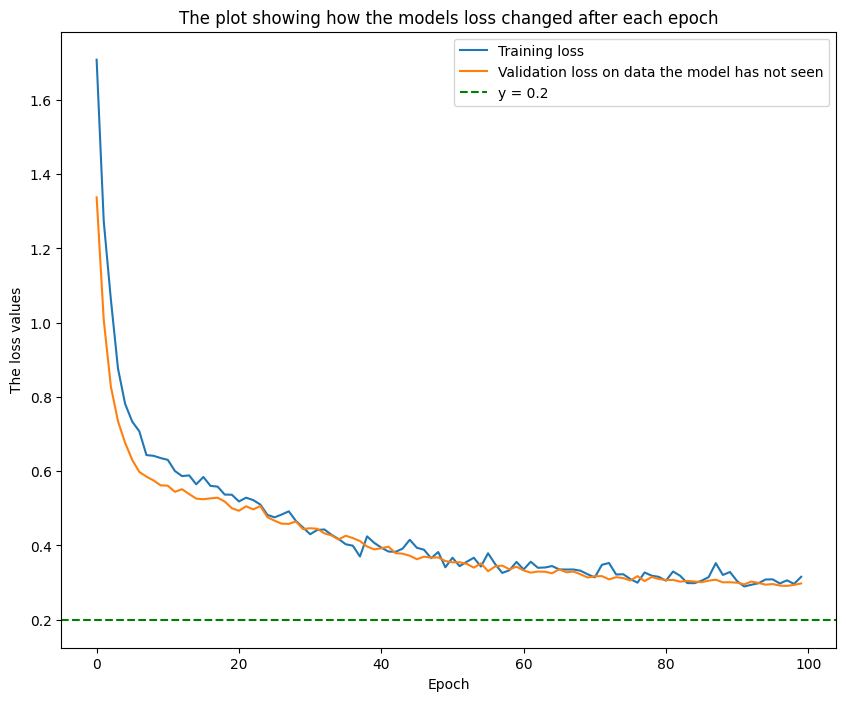

In [ ]:
# so we make a plot of all the loss error values and validation error value to make sure it reduces generally
plt.figure(figsize = (10,8))
plt.plot(history_storm.history['loss'], label = 'Training loss')
plt.plot(history_storm.history['val_loss'], label = 'Validation loss on data the model has not seen')
plt.axhline(y = 0.2, linestyle = '--', linewidth = 1.5, color = 'green', label = 'y = 0.2')
plt.xlabel('Epoch')
plt.ylabel('The loss values')
plt.title('The plot showing how the models loss changed after each epoch')
plt.legend()
plt.savefig('The plot showing the change in the models loss aftr each epoch for storm time tec.png', dpi = 300, bbox_inches = 'tight')
plt.show()

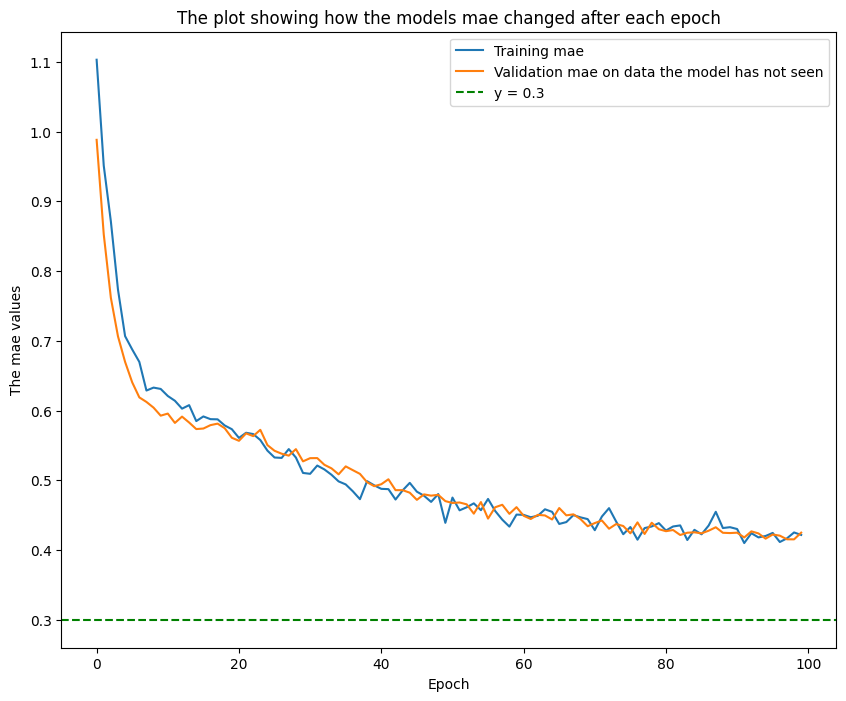

In [ ]:
# so we make a plot of all the loss error values and validation error value to make sure it reduces generally
plt.figure(figsize = (10,8))
plt.plot(history_storm.history['mae'], label = 'Training mae')
plt.plot(history_storm.history['val_mae'], label = 'Validation mae on data the model has not seen')
plt.axhline(y = 0.3, linestyle = '--', linewidth = 1.5, color = 'green', label = 'y = 0.3')
plt.xlabel('Epoch')
plt.ylabel('The mae values')
plt.title('The plot showing how the models mae changed after each epoch')
plt.legend()
plt.savefig('The plot showing the change in the models mae after each epoch for storm time tec.png', dpi = 300, bbox_inches = 'tight')
plt.show()

## Checking how much variaance this model expains on the data

In [ ]:
y_storm_pred = model_storm.predict(x_storm_test)

# now check the r2 score
r2 = r2_score(y_tec_test, y_storm_pred)
r2

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


0.6762280703558514

## Now we check the feature importance of the variables in this model

In [ ]:
x_storm_shap = x_storm_test[:100]
x_storm_shap.shape

# now we generate the shap values using deep explainer
explainer_storm = shap.DeepExplainer(model_storm, x_storm_shap)

# now generate
shap_storm_values  = explainer_storm.shap_values(x_storm_shap)
shap_storm_values.shape, x_storm_shap.shape

/usr/local/lib/python3.12/dist-packages/shap/explainers/_deep/deep_tf.py:94: UserWarning: Your TensorFlow version is newer than 2.4.0 and so graph support has been removed in eager mode and some static graphs may not be supported. See PR #1483 for discussion.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/keras/src/models/functional.py:241: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: keras_tensor_18
Received: inputs=['Tensor(shape=(100, 1, 3))']
  warnings.warn(msg)
/usr/local/lib/python3.12/dist-packages/keras/src/models/functional.py:241: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: keras_tensor_18
Received: inputs=['Tensor(shape=(200, 1, 3))']
  warnings.warn(msg)


((100, 1, 3, 1), (100, 1, 3))

In [ ]:
# now we reshape the values to fit our model perfectly
x_storm_shap = x_storm_shap.reshape(x_storm_shap.shape[0], x_storm_shap.shape[2])
shap_storm_values = shap_storm_values.reshape(shap_storm_values.shape[0], shap_storm_values.shape[2])
x_storm_shap.shape, shap_storm_values.shape

((100, 3), (100, 3))

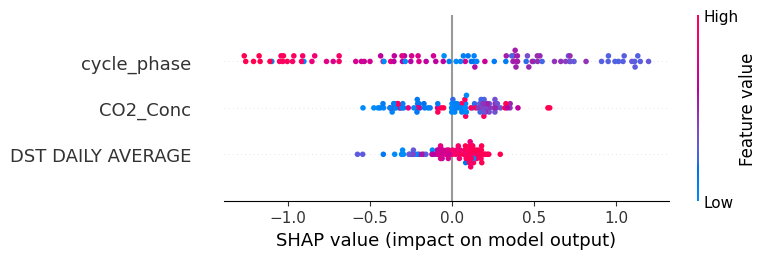

In [ ]:
# now we can check the summary plot
shap.summary_plot(shap_storm_values, x_storm_shap, feature_names = feature_names, show = False)
plt.savefig('The summary plot showing the importance of the features used in the model during storm time.png', dpi = 300, bbox_inches = 'tight')
plt.show()

## Next we can also numerically check the feature importance

In [ ]:
# we use the mean absolute value method
mean_abs_storm_shap = np.mean(
    np.abs(shap_storm_values), axis = 0
)

# next we create a dictionary of the feature importance
feature_importance = pd.DataFrame(
    {
        'feature_importance' : feature_names,
    'Feature average importance' : mean_abs_storm_shap
    }
).sort_values(by = 'Feature average importance', ascending = False)

# PRINT RESULT
feature_importance

,feature_importance,Feature average importance
0,cycle_phase,0.594543
2,CO2_Conc,0.215297
1,DST DAILY AVERAGE,0.134977


# Now checking how the features in the model affect the prediction of TEC during storm time

### checking for the 50th value

In [ ]:
# we do this using force plots
# the plot is supported by javascript so we import the javascript stuff library for python
shap.initjs()

# now we import display to help the display of the plots
from IPython.display import display

display(
    shap.force_plot(
    explainer3.expected_value.numpy(),
    shap_storm_values[50],
    feature_names = feature_names
)
)

### checking for the 70th tec value

In [ ]:
# we do this using force plots
# the plot is supported by javascript so we import the javascript stuff library for python
shap.initjs()

# now we import display to help the display of the plots
from IPython.display import display

display(
    shap.force_plot(
    explainer3.expected_value.numpy(),
    shap_storm_values[70],
    feature_names = feature_names
)
)

### check the 10th value

In [ ]:
# we do this using force plots
# the plot is supported by javascript so we import the javascript stuff library for python
shap.initjs()

# now we import display to help the display of the plots
from IPython.display import display

display(
    shap.force_plot(
    explainer3.expected_value.numpy(),
    shap_storm_values[10],
    feature_names = feature_names
)
)

### now let's study the interaction relationship between the variables

### Checking the interaction between dst and co2

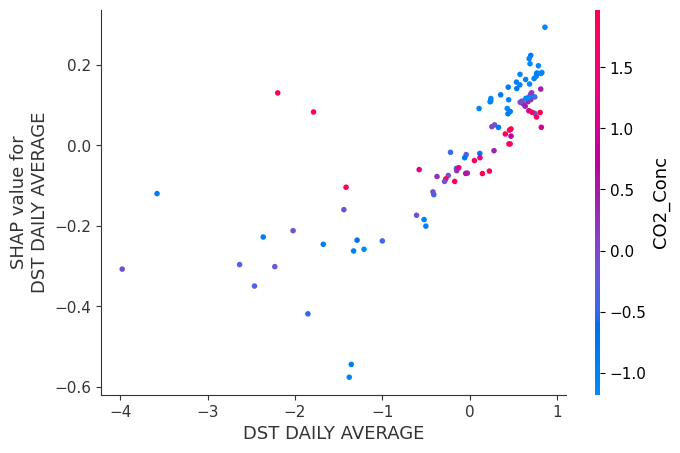

In [ ]:
# now we study interaction using dependence plots
shap.dependence_plot('DST DAILY AVERAGE', shap_storm_values, x_storm_shap, feature_names = feature_names, interaction_index = 'CO2_Conc', show = False)
plt.savefig('The scatter plot showing how the impact of dst on storm time tec prediction changes with dst as well as its interaction with co2 on tec.png', dpi = 300, bbox_inches = 'tight')
plt.show()

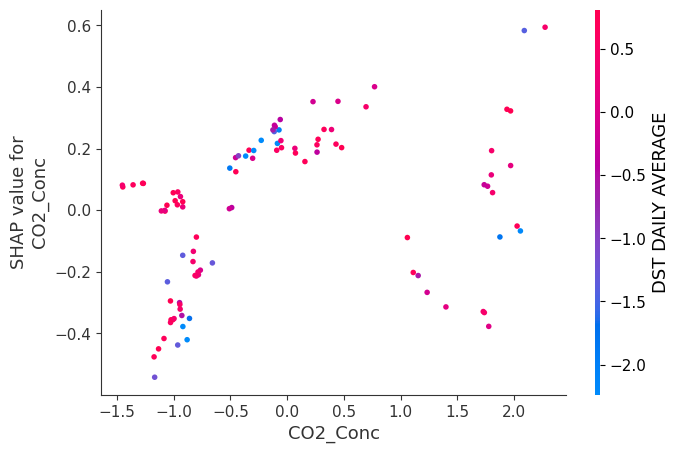

In [ ]:
# now we study interaction using dependence plots
shap.dependence_plot('CO2_Conc', shap_storm_values, x_storm_shap, feature_names = feature_names, interaction_index = 'DST DAILY AVERAGE', show = False)
plt.savefig('The scatter plot showing how the impact of co2 on storm time tec prediction changes with co2 as well as its interaction with dst on tec.png', dpi = 300, bbox_inches = 'tight')
plt.show()

#### We can also numerically heck this interaction

In [ ]:
# first we prepare all the data
co2_storm = x_storm_shap[:, 2]
dst_storm = x_storm_shap[:, 1]
cycle_phase_storm = x_storm_shap[:, 0]

# and the shap values
co2_shap_storm = shap_storm_values[:, 2]
dst_shap_storm = shap_storm_values[:, 1]
cycle_phase_shap_storm = shap_storm_values[:, 0]

In [ ]:
# for dst on co2 we be like
mutual_info_storm = mutual_info_regression(dst_storm.reshape(-1, 1), co2_shap_storm)

# now we print the result
print(f"Now the mutual information of dst on co2 impact on storm time tec prediction {mutual_info_storm[0]}")

Now the mutual information of dst on co2 impact on storm time tec prediction 0.032309321697743254


In [ ]:
# for co2 on dst we be like
mutual_info_storm = mutual_info_regression(co2_storm.reshape(-1, 1), dst_shap_storm)

# now we print the result
print(f"Now the mutual information of co2 on dst impact on storm time tec prediction {mutual_info_storm[0]}")

Now the mutual information of co2 on dst impact on storm time tec prediction 0.4537258149228327


### Next studying the interaction between co2 and cycle phase

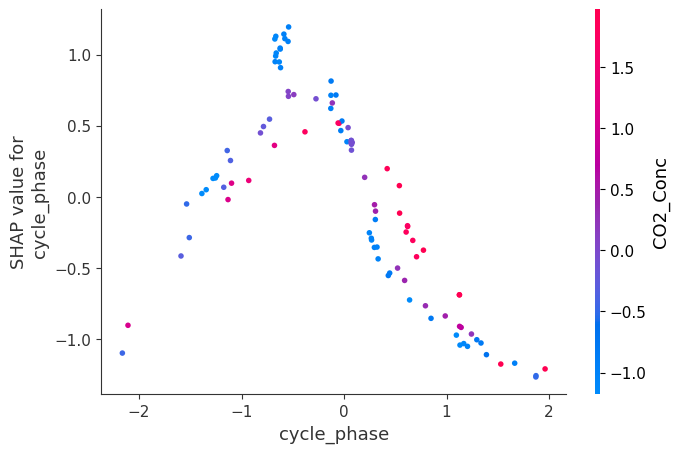

In [ ]:
# now we study interaction using dependence plots
shap.dependence_plot('cycle_phase', shap_storm_values, x_storm_shap, feature_names = feature_names, interaction_index = 'CO2_Conc', show = False)
plt.savefig('The scatter plot showing how the impact of cycle phase on storm time tec prediction changes with cycle phase as well as its interaction with co2 on tec.png', dpi = 300, bbox_inches = 'tight')
plt.show()

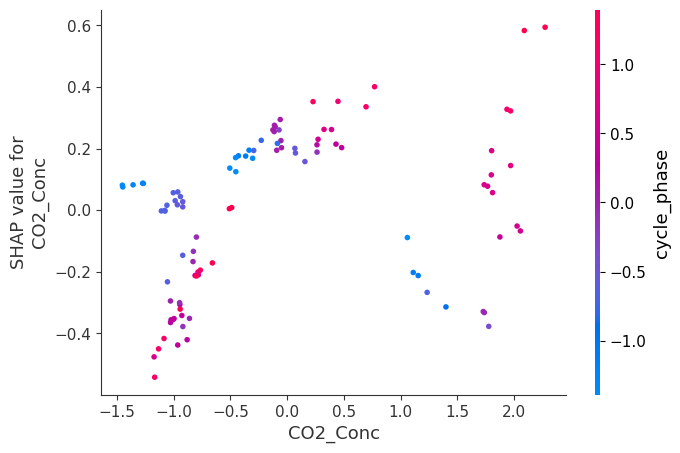

In [ ]:
# now we study interaction using dependence plots
shap.dependence_plot('CO2_Conc', shap_storm_values, x_storm_shap, feature_names = feature_names, interaction_index = 'cycle_phase', show = False)
plt.savefig('The scatter plot showing how the impact of co2 on storm time tec prediction changes with co2 as well as its interaction with cycle phase on tec.png', dpi = 300, bbox_inches = 'tight')
plt.show()

#### To numerically observe this interaction

In [ ]:
# for co2 on cycle phase we be like
mutual_info_storm = mutual_info_regression(co2_storm.reshape(-1, 1), cycle_phase_shap_storm)

# now we print the result
print(f"Now the mutual information of co2 on cycle phase impact on storm time tec prediction {mutual_info_storm[0]}")

Now the mutual information of co2 on cycle phase impact on storm time tec prediction 0.5885164598668178


In [ ]:
# for cycle phase on co2 we be like
mutual_info_storm = mutual_info_regression(cycle_phase_storm.reshape(-1, 1), co2_shap_storm)

# now we print the result
print(f"Now the mutual information of cycle phase on co2 impact on storm time tec prediction {mutual_info_storm[0]}")

Now the mutual information of cycle phase on co2 impact on storm time tec prediction 0.5496975057110891


### Now to check the interaction betwen dst and cycle phase

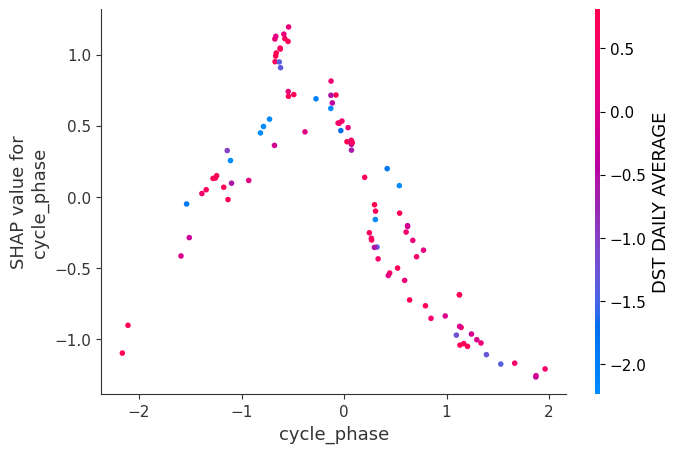

In [ ]:
# now we study interaction using dependence plots
shap.dependence_plot('cycle_phase', shap_storm_values, x_storm_shap, feature_names = feature_names, interaction_index = 'DST DAILY AVERAGE', show = False)
plt.savefig('The scatter plot showing how the impact of cycle phase on storm time tec prediction changes with cycle phase as well as its interaction with dst on tec.png', dpi = 300, bbox_inches = 'tight')
plt.show()

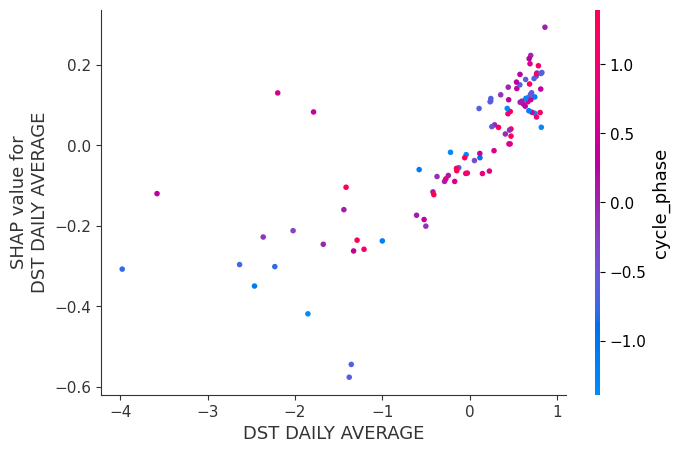

In [ ]:
# now we study interaction using dependence plots
shap.dependence_plot('DST DAILY AVERAGE', shap_storm_values, x_storm_shap, feature_names = feature_names, interaction_index = 'cycle_phase', show = False)
plt.savefig('The scatter plot showing how the impact of dst on storm time tec prediction changes with dst as well as its interaction with cycle phase on tec.png', dpi = 300, bbox_inches = 'tight')
plt.show()

#### We can numerically check this relationship

In [ ]:
# for cycle phase on dst we be like
mutual_info_storm = mutual_info_regression(cycle_phase_storm.reshape(-1, 1), dst_shap_storm)

# now we print the result
print(f"Now the mutual information of cycle phase on dst impact on storm time tec prediction {mutual_info_storm[0]}")

Now the mutual information of cycle phase on dst impact on storm time tec prediction 0.19771206896193805


In [ ]:
# for dst on cycle phase we be like
mutual_info_storm = mutual_info_regression(dst_storm.reshape(-1, 1), cycle_phase_shap_storm)

# now we print the result
print(f"Now the mutual information of dst on cycle phase impact on storm time tec prediction {mutual_info_storm[0]}")

Now the mutual information of dst on cycle phase impact on storm time tec prediction 0.19275811035649149


## Observe the storm - time effects for foF2

In [ ]:
# now we perform like a filteration process
y_foF2_train = y_storm_train['Average of foF2']
y_foF2_train

,Average of foF2
9062,-0.957856
8410,1.034936
8097,0.880689
6099,-1.086769
7135,0.524152
...,...
4669,-0.394451
5265,-0.339377
8767,0.913636
12393,0.187896


In [ ]:
y_foF2_test = y_storm_test['Average of foF2']
y_foF2_test

,Average of foF2
8597,-0.991234
7669,-1.126283
4321,-0.097134
4592,0.866782
4594,0.889716
...,...
4234,1.201194
6909,-1.388330
4253,-0.279322
5483,-0.789474


In [ ]:
# checking the shape of x_storm_train
x_storm_train.shape, x_storm_test.shape

((266, 1, 3), (115, 1, 3))

### Now let's build the model

In [ ]:
model_storm2 = Sequential(
    [
        Conv1D(
            filters = 16,
            # so we want a kernel size of 1 as our data is only in one time step
            kernel_size = 1,
            # then we will choose the relu activation as it is better than the sigmoid activation for regression tasks
            activation = 'relu',
            # then lastly we want to give them the shape of the data coming in
            input_shape = (1, x_storm_train.shape[2])
        ),
        # now we add another layer and this layer is used for formatting the output of the convolutionary layer in a form that other layers can use
        Flatten(),
        # next is the dense layer which uses 32 neurons to learn patterns from the patterns learnt in tjhe convolutionary layer
        Dense(32, activation = 'relu'),
        # in order to prevent overfitting we will have to drop about 20 percent of the features
        Dropout(0.2),
        # lastly the output layer here we just end up studying to give result and in order to make sure that this is a regression task as it is meant to be are activation is linear here
        Dense(1, activation = 'linear')
    ]
)


# now we compile every thing and assign how we will calculate the models loss and the metric to evaluate its prediction here
model_storm2.compile(optimizer = 'adam', loss = 'mse', metrics = ['mae'])
# now finally we print the model's summary
model_storm2.summary()

/usr/local/lib/python3.12/dist-packages/keras/src/layers/convolutional/base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv1d_5 (Conv1D)               │ (None, 1, 16)          │            64 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_5 (Flatten)             │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_10 (Dense)                │ (None, 32)             │           544 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_11 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 641 (2.50 KB)

 Trainable params: 641 (2.50 KB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
# now we give the instructions on how the model is going to learn
# so we assign everything the model realises during training to history
history_storm2 = model_storm2.fit(
    x_storm_train,
    y_foF2_train,
    epochs = 100,
    batch_size = 16,
    # to test the model on data it wasnt trained with we use validation test
    validation_data = (x_storm_test, y_foF2_test)
)

Epoch 1/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 1.0799 - mae: 0.8660 - val_loss: 0.7869 - val_mae: 0.7351
Epoch 2/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.8437 - mae: 0.7446 - val_loss: 0.7199 - val_mae: 0.6966
Epoch 3/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.8963 - mae: 0.7803 - val_loss: 0.6659 - val_mae: 0.6630
Epoch 4/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.7666 - mae: 0.7274 - val_loss: 0.6323 - val_mae: 0.6402
Epoch 5/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.7151 - mae: 0.6895 - val_loss: 0.6034 - val_mae: 0.6208
Epoch 6/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.7266 - mae: 0.6874 - val_loss: 0.5709 - val_mae: 0.6001
Epoch 7/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.7234 - mae: 0.6747 - val_loss: 0.5476 - val_mae: 0.5857
Epoch 8/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.5999 - mae: 0.6236 - val_loss: 0.5292 - val_mae: 0.5747
Epoch 9/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - los

### So we need to check if the model generalises well

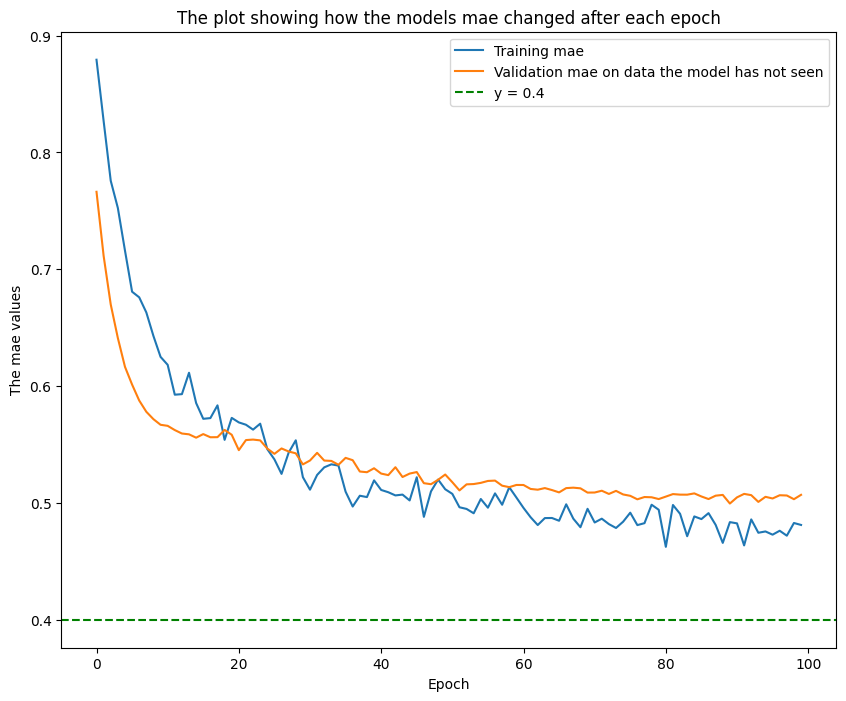

In [ ]:
# so we make a plot of all the mae error values and validation mae error value to make sure it reduces generally
plt.figure(figsize = (10,8))
plt.plot(history_storm2.history['mae'], label = 'Training mae')
plt.plot(history_storm2.history['val_mae'], label = 'Validation mae on data the model has not seen')
plt.axhline(y = 0.4, linestyle = '--', linewidth = 1.5, color = 'green', label = 'y = 0.4')
plt.xlabel('Epoch')
plt.ylabel('The mae values')
plt.title('The plot showing how the models mae changed after each epoch')
plt.legend()
plt.savefig('The plot showing the change in the models mae aftr each epoch for storm time foF2.png', dpi = 300, bbox_inches = 'tight')
plt.show()

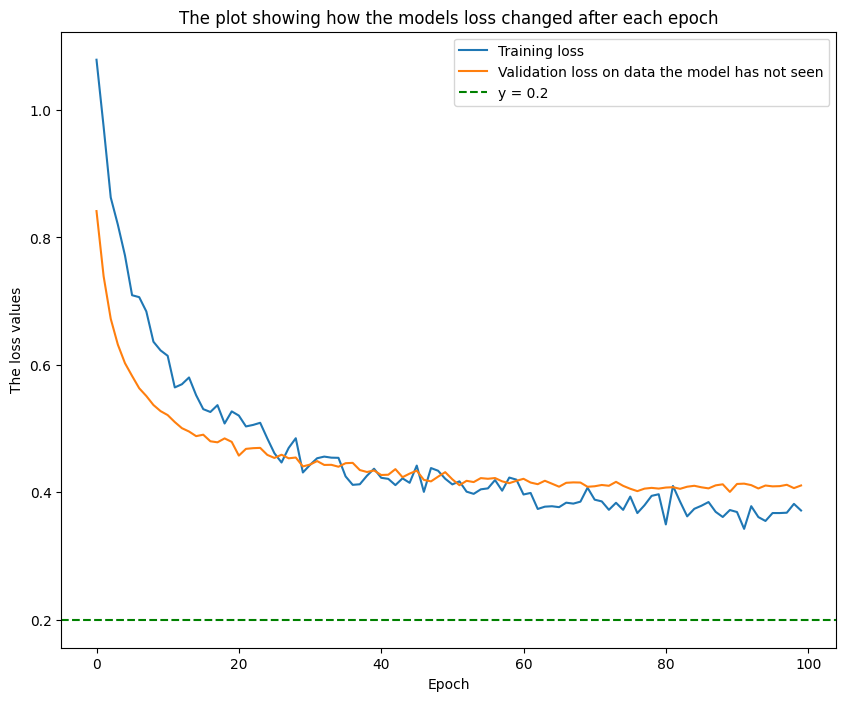

In [ ]:
# so we make a plot of all the loss error values and validation error value to make sure it reduces generally
plt.figure(figsize = (10,8))
plt.plot(history_storm2.history['loss'], label = 'Training loss')
plt.plot(history_storm2.history['val_loss'], label = 'Validation loss on data the model has not seen')
plt.axhline(y = 0.2, linestyle = '--', linewidth = 1.5, color = 'green', label = 'y = 0.2')
plt.xlabel('Epoch')
plt.ylabel('The loss values')
plt.title('The plot showing how the models loss changed after each epoch')
plt.legend()
plt.savefig('The plot showing the change in the models loss aftr each epoch for storm time foF2.png', dpi = 300, bbox_inches = 'tight')
plt.show()

### let check how much variance is explained by the model

In [ ]:
y2_storm_pred = model_storm2.predict(x_storm_test)

y2_storm_pred

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step 


array([[ 0.03491428],
       [-0.13344547],
       [ 1.1757671 ],
       [ 0.23824215],
       [ 0.92021716],
       [ 1.1673709 ],
       [-0.33336645],
       [-0.48132297],
       [ 1.052551  ],
       [ 0.21453597],
       [-0.40776405],
       [ 1.090505  ],
       [ 0.23212051],
       [-0.39875302],
       [ 0.8367517 ],
       [ 0.19162495],
       [ 0.05490099],
       [ 0.07962629],
       [ 0.3703373 ],
       [ 0.16223258],
       [-0.1724306 ],
       [-1.0498066 ],
       [ 1.1087776 ],
       [-0.39079544],
       [-0.56183636],
       [ 0.58240414],
       [ 0.3015228 ],
       [-0.48206577],
       [-0.36743328],
       [ 0.09498793],
       [ 0.14108439],
       [ 0.58376133],
       [ 0.46586516],
       [-0.8067236 ],
       [ 0.05208298],
       [ 0.20482555],
       [-0.42030808],
       [ 0.41970438],
       [ 1.0951531 ],
       [-0.6028744 ],
       [ 0.61663175],
       [-0.76151705],
       [-1.0407143 ],
       [-0.0458177 ],
       [ 1.0133564 ],
       [ 1

In [ ]:
r2 = r2_score(y_foF2_test, y2_storm_pred)
r2

0.5144837213395849

### Check the feature importance

In [ ]:
x_storm_shap2 = x_storm_test[:100]
x_storm_shap2.shape

# now we generate the shap values using deep explainer
explainer_storm2 = shap.DeepExplainer(model_storm2, x_storm_shap2)

# now generate
shap_storm_values2  = explainer_storm2.shap_values(x_storm_shap2)
shap_storm_values2.shape, x_storm_shap2.shape

/usr/local/lib/python3.12/dist-packages/shap/explainers/_deep/deep_tf.py:94: UserWarning: Your TensorFlow version is newer than 2.4.0 and so graph support has been removed in eager mode and some static graphs may not be supported. See PR #1483 for discussion.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/keras/src/models/functional.py:241: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: keras_tensor_30
Received: inputs=['Tensor(shape=(100, 1, 3))']
  warnings.warn(msg)
/usr/local/lib/python3.12/dist-packages/keras/src/models/functional.py:241: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: keras_tensor_30
Received: inputs=['Tensor(shape=(200, 1, 3))']
  warnings.warn(msg)


((100, 1, 3, 1), (100, 1, 3))

In [ ]:
# now we reshape the values to fit our model perfectly
x_storm_shap2 = x_storm_shap2.reshape(x_storm_shap2.shape[0], x_storm_shap2.shape[2])
shap_storm_values2 = shap_storm_values2.reshape(shap_storm_values2.shape[0], shap_storm_values2.shape[2])
x_storm_shap2.shape, shap_storm_values2.shape

((100, 3), (100, 3))

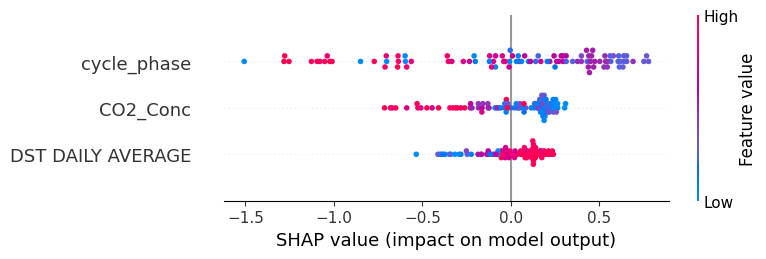

In [ ]:
# now we can check the summary plot
shap.summary_plot(shap_storm_values2, x_storm_shap2, feature_names = feature_names, show = False)
plt.savefig('The summary plot showing the importance of the features used in the model during storm time2.png', dpi = 300, bbox_inches = 'tight')
plt.show()

#### We can confirm this numerically

In [ ]:
# we use the mean absolute value method
mean_abs_storm_shap = np.mean(
    np.abs(shap_storm_values2), axis = 0
)

# next we create a dictionary of the feature importance
feature_importance = pd.DataFrame(
    {
        'feature_importance' : feature_names,
    'Feature average importance' : mean_abs_storm_shap
    }
).sort_values(by = 'Feature average importance', ascending = False)

# PRINT RESULT
feature_importance

,feature_importance,Feature average importance
0,cycle_phase,0.469147
2,CO2_Conc,0.208548
1,DST DAILY AVERAGE,0.137198


### Let's see how the variables in the model affect the foF2 prediction in this storm time model

In [ ]:
# we do this using force plots
# the plot is supported by javascript so we import the javascript stuff library for python
shap.initjs()

# now we import display to help the display of the plots
from IPython.display import display

display(
    shap.force_plot(
    explainer3.expected_value.numpy(),
    shap_storm_values2[10],
    feature_names = feature_names
)
)

In [ ]:
# we do this using force plots
# the plot is supported by javascript so we import the javascript stuff library for python
shap.initjs()

# now we import display to help the display of the plots
from IPython.display import display

display(
    shap.force_plot(
    explainer3.expected_value.numpy(),
    shap_storm_values2[50],
    feature_names = feature_names
)
)

In [ ]:
# we do this using force plots
# the plot is supported by javascript so we import the javascript stuff library for python
shap.initjs()

# now we import display to help the display of the plots
from IPython.display import display

display(
    shap.force_plot(
    explainer3.expected_value.numpy(),
    shap_storm_values2[70],
    feature_names = feature_names
)
)

### Next we check the interaction between the variables

#### Studying the interaction between dst and co2

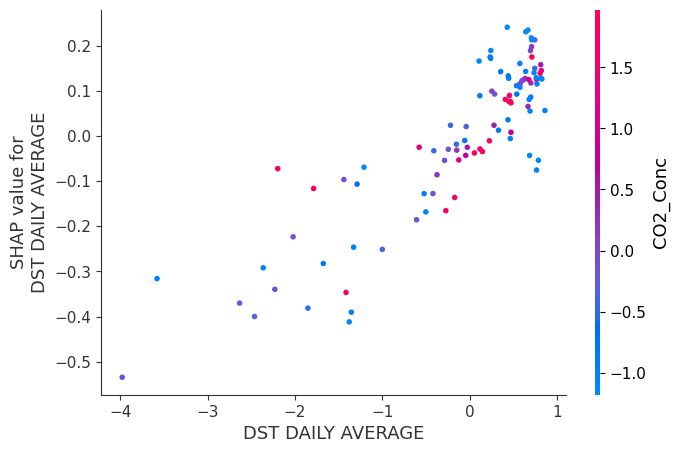

In [ ]:
# now we study interaction using dependence plots
shap.dependence_plot('DST DAILY AVERAGE', shap_storm_values2, x_storm_shap2, feature_names = feature_names, interaction_index = 'CO2_Conc', show = False)
plt.savefig('The scatter plot showing how the impact of dst on storm time foF2 prediction changes with dst as well as its interaction with co2 on foF2.png', dpi = 300, bbox_inches = 'tight')
plt.show()

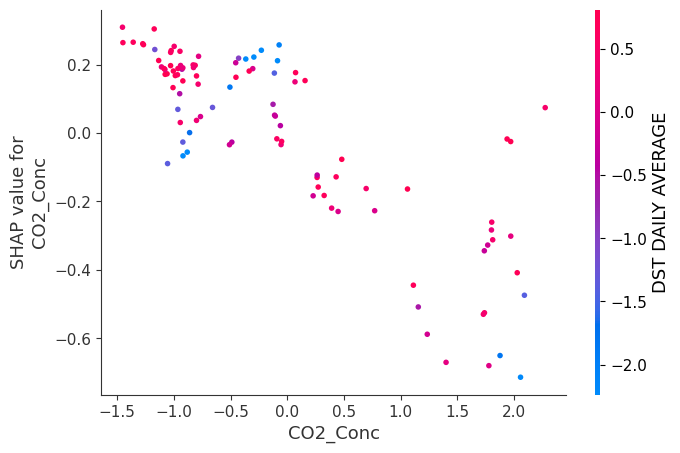

In [ ]:
# now we study interaction using dependence plots
shap.dependence_plot('CO2_Conc', shap_storm_values2, x_storm_shap2, feature_names = feature_names, interaction_index = 'DST DAILY AVERAGE', show = False)
plt.savefig('The scatter plot showing how the impact of co2 on storm time foF2 prediction changes with co2 as well as its interaction with dst on foF2.png', dpi = 300, bbox_inches = 'tight')
plt.show()

##### Numerically check the mutual relation whether dst or co2 affects co2 or dst's impact on foF2 prediction

In [ ]:
# first we prepare all the data
co2_storm2 = x_storm_shap2[:, 2]
dst_storm2 = x_storm_shap2[:, 1]
cycle_phase_storm2 = x_storm_shap2[:, 0]

# and the shap values
co2_shap_storm2 = shap_storm_values2[:, 2]
dst_shap_storm2 = shap_storm_values[:, 1]
cycle_phase_shap_storm2 = shap_storm_values2[:, 0]

In [ ]:
# for co2 on dst we be like
mutual_info_storm2 = mutual_info_regression(co2_storm2.reshape(-1, 1), dst_shap_storm2)

# now we print the result
print(f"Now the mutual information of co2 on dst impact on storm time foF2 prediction {mutual_info_storm2[0]}")

Now the mutual information of co2 on dst impact on storm time foF2 prediction 0.453752130712306


In [ ]:
# for dst on co2 we be like
mutual_info_storm2 = mutual_info_regression(dst_storm2.reshape(-1, 1), co2_shap_storm2)

# now we print the result
print(f"Now the mutual information of dst on co2 impact on storm time foF2 prediction {mutual_info_storm2[0]}")

Now the mutual information of dst on co2 impact on storm time foF2 prediction 0.07884615221987046


#### Checking the interaction of co2 and cycle phase

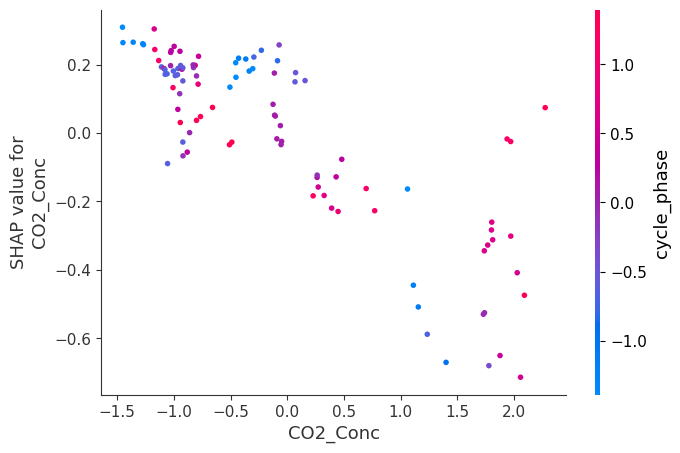

In [ ]:
# now we study interaction using dependence plots
shap.dependence_plot('CO2_Conc', shap_storm_values2, x_storm_shap2, feature_names = feature_names, interaction_index = 'cycle_phase', show = False)
plt.savefig('The scatter plot showing how the impact of co2 on storm time foF2 prediction changes with co2 as well as its interaction with cycle phase on foF2.png', dpi = 300, bbox_inches = 'tight')
plt.show()

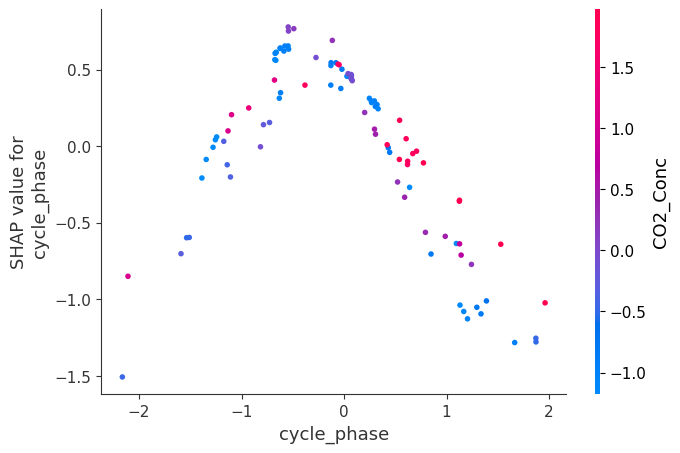

In [ ]:
# now we study interaction using dependence plots
shap.dependence_plot('cycle_phase', shap_storm_values2, x_storm_shap2, feature_names = feature_names, interaction_index = 'CO2_Conc', show = False)
plt.savefig('The scatter plot showing how the impact of cycle phase on storm time foF2 prediction changes with cycle phase as well as its interaction with co2 on foF2.png', dpi = 300, bbox_inches = 'tight')
plt.show()

##### Checking the interaction numerically

In [ ]:
# for co2 on cycle phase we be like
mutual_info_storm2 = mutual_info_regression(co2_storm2.reshape(-1, 1), cycle_phase_shap_storm2)

# now we print the result
print(f"Now the mutual information of co2 on cycle phase impact on storm time foF2 prediction {mutual_info_storm2[0]}")

Now the mutual information of co2 on cycle phase impact on storm time foF2 prediction 0.49818430062458363


In [ ]:
# for dst on co2 we be like
mutual_info_storm2 = mutual_info_regression(cycle_phase_storm2.reshape(-1, 1), co2_shap_storm2)

# now we print the result
print(f"Now the mutual information of cycle phase on co2 impact on storm time foF2 prediction {mutual_info_storm2[0]}")

Now the mutual information of cycle phase on co2 impact on storm time foF2 prediction 0.5420320651967372


#### Checking the interaction between dst and cycle phase

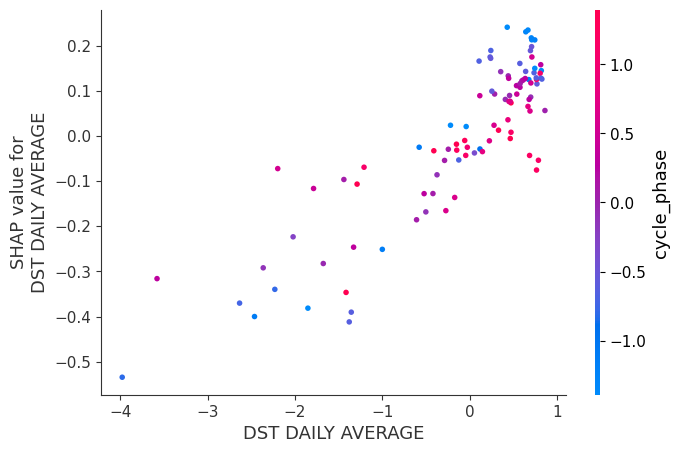

In [ ]:
# now we study interaction using dependence plots
shap.dependence_plot('DST DAILY AVERAGE', shap_storm_values2, x_storm_shap2, feature_names = feature_names, interaction_index = 'cycle_phase', show = False)
plt.savefig('The scatter plot showing how the impact of dst on storm time foF2 prediction changes with dst as well as its interaction with cycle phase on foF2.png', dpi = 300, bbox_inches = 'tight')
plt.show()

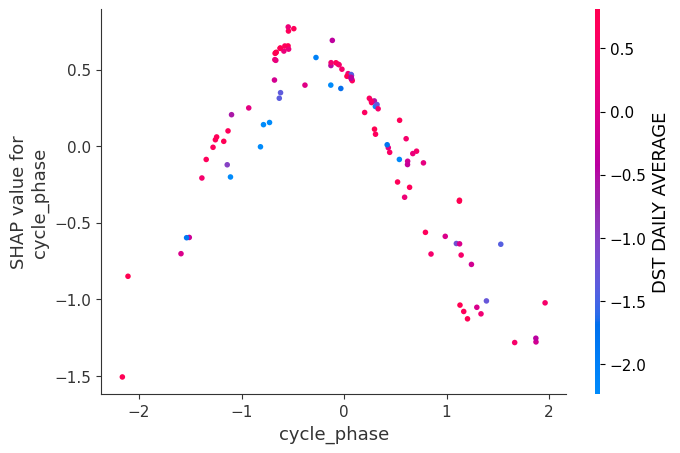

In [ ]:
# now we study interaction using dependence plots
shap.dependence_plot('cycle_phase', shap_storm_values2, x_storm_shap2, feature_names = feature_names, interaction_index = 'DST DAILY AVERAGE', show = False)
plt.savefig('The scatter plot showing how the impact of cycle phase on storm time foF2 prediction changes with cycle phase as well as its interaction with dst on foF2.png', dpi = 300, bbox_inches = 'tight')
plt.show()

##### Check this interaction numerically

In [ ]:
# for co2 on cycle phase we be like
mutual_info_storm2 = mutual_info_regression(dst_storm2.reshape(-1, 1), cycle_phase_shap_storm2)

# now we print the result
print(f"Now the mutual information of dst on cycle phase impact on storm time foF2 prediction {mutual_info_storm2[0]}")

Now the mutual information of dst on cycle phase impact on storm time foF2 prediction 0.1150148100936037


In [ ]:
# for co2 on cycle phase we be like
mutual_info_storm2 = mutual_info_regression(cycle_phase_storm2.reshape(-1, 1), dst_shap_storm2)

# now we print the result
print(f"Now the mutual information of cycle phase on dst impact on storm time foF2 prediction {mutual_info_storm2[0]}")

Now the mutual information of cycle phase on dst impact on storm time foF2 prediction 0.19771206896193805
